# Multimodal Modeling Explorations

In [1]:
import csv, os, sys, re, string, json, glob, shutil, random, datetime, math

import cv2
import pandas as pd
import numpy as np

from IPython.display import HTML as html_print
from IPython.display import Markdown
from IPython.display import clear_output

# from IPython.display import Image
from PIL import Image, ImageDraw, ImageFont
from ipywidgets import Video

import torch
from transformers import AutoTokenizer
import nltk
from nltk.tokenize import word_tokenize, sent_tokenize

import warnings
warnings.filterwarnings('ignore')

import seaborn as sns
sns.set()
from matplotlib import pyplot as plt
import matplotlib.patches as patches
%pylab inline

# for auto-reloading external modules
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
sys.path.insert(0, "/local1/bryanzhou008/jarvis/project_jarvis/all_visualizations")
sys.path.insert(0, "/local1/bryanzhou008/jarvis/project_jarvis/data_processing")

from visualization_utils import *
from sequencing_utils import show_one_sampled_data as show_one_sampled_data_wikihow
from sequencing_data_processors import WikiHowGeneralProcessor

# OOD

## Ego4D Datasets

In [3]:
# Use annotations to filter out the videos list we want.
annots_root = "/local1/hu528/ego4d_data_old/v1/annotations/"
curr_videos_root = "/local1/jrbronkar/ego4d_videos/v1/full_scale"
curr_videos_root = "/local1/hu528/ego4d_data/v1/full_scale"

all_narrations_file = os.path.join(annots_root, "narration.json")
all_narrations = json.load(open(all_narrations_file))

In [4]:
scod_train_file = "fho_scod_train.json"
scod_train_file = os.path.join(annots_root, scod_train_file)

scod_val_file = "fho_scod_val.json"
scod_val_file = os.path.join(annots_root, scod_val_file)

scod_train_data = json.load(open(scod_train_file))
scod_val_data = json.load(open(scod_val_file))

scod_clips = scod_train_data["clips"] + scod_val_data["clips"]

downloaded_video_id_and_paths = {
    x.split(".mp4")[0]: os.path.join(curr_videos_root, x)
    for x in os.listdir(curr_videos_root) if ".mp4" in x
}
print("Currently we downloaded {} ego4d videos.".format(len(downloaded_video_id_and_paths)))

downloaded_scod_clips = []

for scod_clip in scod_clips:
    video_uid = scod_clip["video_uid"]
    if video_uid in downloaded_video_id_and_paths:
        downloaded_scod_clips.append(scod_clip)

print("And there are {} clips available for scod.".format(len(downloaded_scod_clips)))

Currently we downloaded 716 ego4d videos.
And there are 31872 clips available for scod.


In [8]:
# json_numbers = json.dumps(scod_clips)
# print(type(json_numbers))
# print(json_numbers)

#### Essential Functions

In [ ]:
from allennlp_models.pretrained import load_predictor
predictor = load_predictor("structured-prediction-srl-bert")

predictor.predict(sentence="Did Uriah honestly think he could beat the game in under three hours?.")

[autoreload of torch.storage failed: Traceback (most recent call last):
  File "/home/bryanzhou008/miniconda3/envs/myenv/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 261, in check
    superreload(m, reload, self.old_objects)
  File "/home/bryanzhou008/miniconda3/envs/myenv/lib/python3.8/site-packages/IPython/extensions/autoreload.py", line 459, in superreload
    module = reload(module)
  File "/home/bryanzhou008/miniconda3/envs/myenv/lib/python3.8/importlib/__init__.py", line 169, in reload
    _bootstrap._exec(spec, module)
  File "<frozen importlib._bootstrap>", line 604, in _exec
  File "<frozen importlib._bootstrap_external>", line 843, in exec_module
  File "<frozen importlib._bootstrap>", line 219, in _call_with_frames_removed
  File "/home/bryanzhou008/miniconda3/envs/myenv/lib/python3.8/site-packages/torch/storage.py", line 214, in <module>
    class _UntypedStorage(torch._C.StorageBase, _StorageBase):
AttributeError: module 'torch._C' has no attribute '

In [ ]:
from allennlp.predictors.predictor import Predictor
import allennlp_models.tagging

predictor1 = Predictor.from_path("https://storage.googleapis.com/allennlp-public-models/structured-prediction-srl-bert.2020.12.15.tar.gz")

In [5]:
def get_ego4d_scod_clips_and_frames(
    sampled_scod_clip,
    curr_videos_root,
    show_name="show",
    get_frames=True,
):
    video_uid = sampled_scod_clip["video_uid"]
    ego4d_video_path = os.path.join(
        curr_videos_root,
        "{}.mp4".format(video_uid),
    )
    print("Mother video: {}".format(ego4d_video_path))

    cap = cv2.VideoCapture(ego4d_video_path)
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    frame_cnt = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    duration = float(frame_cnt) / float(fps)
    cap.release()

    print("The fps of video `{}` is: {} of frame counts: {} and duration: {} sec.".format(ego4d_video_path, fps, frame_cnt, duration))

    pre_frame = sampled_scod_clip["pre_frame"]["frame_number"]
    pnr_frame = sampled_scod_clip["pnr_frame"]["frame_number"]
    pos_frame = sampled_scod_clip["post_frame"]["frame_number"]

    pre_secs = pre_frame / fps
    pnr_secs = pnr_frame / fps
    pos_secs = pos_frame / fps

    pre_timestamp = str(datetime.timedelta(seconds=pre_secs))
    pnr_timestamp = str(datetime.timedelta(seconds=pnr_secs))
    pos_timestamp = str(datetime.timedelta(seconds=pos_secs))

    print(pre_frame, pnr_frame, pos_frame)
    print(pre_timestamp, pnr_timestamp, pos_timestamp)

    pre_timestamp_secs = math.floor(float(pre_timestamp.split(":")[-1]))
    pos_timestamp_secs = math.ceil(float(pos_timestamp.split(":")[-1]))

    pre_timestamp = ":".join(pre_timestamp.split(":")[:-1]) + ":" + str(pre_timestamp_secs)
    pos_timestamp = ":".join(pos_timestamp.split(":")[:-1]) + ":" + str(pos_timestamp_secs)

    # show_name = "show"
    if os.path.exists("./media/{}.mp4".format(show_name)):
        os.remove("./media/{}.mp4".format(show_name))

    ffmpeg_video_cmd = (
        "/home/telinwu/ffmpeg-git-20220910-amd64-static/ffmpeg -ss {} -to {} "
        "-i {} -c copy -loglevel panic ./media/{}.mp4".format(
            pre_timestamp,
            pos_timestamp,
            ego4d_video_path,
            show_name,
        )
    )
    os.system(ffmpeg_video_cmd)
    print("Executed command: {}".format(ffmpeg_video_cmd))
    
    if get_frames:
        for frame_name in ["pre_frame", "pnr_frame", "post_frame"]:
            if os.path.exists("./media/{}.png".format(frame_name)):
                os.remove("./media/{}.png".format(frame_name))
            frame_cnt = sampled_scod_clip[frame_name]["frame_number"]
            ffmpeg_frame_cmd = (
                "/home/telinwu/ffmpeg-git-20220910-amd64-static/ffmpeg "
                "-i {} "
                "-vf select='between(n\,{}\,{})' -vsync 0 "
                "-loglevel panic ./media/{}.png".format(
                    ego4d_video_path,
                    frame_cnt,
                    frame_cnt,
                    frame_name,
                )
            )
            os.system(ffmpeg_frame_cmd)
            print("Executed command: {}".format(ffmpeg_frame_cmd))

    # pprint.pprint(sampled_scod_clip)
    return video_uid, {"pre_frame": pre_frame, "pnr_frame": pnr_frame, "post_frame": pos_frame}
    
    
def get_scod_clipped_narrations(
    scod_clip,
    all_narrations,
    curr_videos_root,
    narration_pass="narration_pass_1",
    top_k=5,
    verbose=False,
):    
    video_uid = scod_clip["video_uid"]
    ego4d_video_path = os.path.join(
        curr_videos_root,
        "{}.mp4".format(video_uid),
    )

    cap = cv2.VideoCapture(ego4d_video_path)
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    frame_cnt = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    if verbose:
        print(ego4d_video_path, fps)
    duration = float(frame_cnt) / float(fps)
    cap.release()
    
    clip_uid = scod_clip["clip_uid"]
    pre_frame = scod_clip["pre_frame"]
    pnr_frame = scod_clip["pnr_frame"]
    pos_frame = scod_clip["post_frame"]
    if narration_pass not in all_narrations[video_uid]:
        return [], []
    curr_narrations = all_narrations[video_uid][narration_pass]["narrations"]
    
    obj_of_changes = []
    for frame in ["pre", "pnr", "post"]:
        obj_info = scod_clip["{}_frame".format(frame)]["bbox"]
        for o in obj_info:
            if o["object_type"] == "object_of_change":
                obj_of_changes.append(o["structured_noun"])
    obj_of_changes = sorted(list(set(obj_of_changes)))
    
    pre_frame_num = pre_frame["frame_number"]
    pnr_frame_num = pnr_frame["frame_number"]
    pos_frame_num = pos_frame["frame_number"]
    
    pre_frame_sec = round(pre_frame_num/fps, 2)
    pnr_frame_sec = round(pnr_frame_num/fps, 2)
    pos_frame_sec = round(pos_frame_num/fps, 2)
    
    clip_narrations = []
    closest_narrations = []
    for i in range(len(curr_narrations)-1):
        timestamp_sec = curr_narrations[i]["timestamp_sec"]
        timestamp_frame = curr_narrations[i]["timestamp_frame"]
        next_timestamp_sec = curr_narrations[i+1]["timestamp_sec"]
        next_timestamp_frame = curr_narrations[i+1]["timestamp_frame"]
        narration_text = curr_narrations[i]["narration_text"]
        if (
            timestamp_frame >= pre_frame_num
            and timestamp_frame <= pos_frame_sec
        ):
            clip_narrations.append((
                timestamp_sec, timestamp_frame,
                next_timestamp_sec, next_timestamp_frame,
                narration_text,
            ))
        
        closest_narrations.append((
            abs(timestamp_frame-pre_frame_num),
            timestamp_sec, timestamp_frame,
            next_timestamp_sec, next_timestamp_frame,
            narration_text,
        ))
        
    closest_narrations = sorted(closest_narrations)[:top_k]
    closest_narrations = [(a, b, c, d, e) for _, a, b, c, d, e in closest_narrations]
    
    if verbose:
        print("FPS: {}".format(fps))
        print("Object of change: {}".format(obj_of_changes))
        print("Pre/PNR/Post frame = {} / {} / {}".format(pre_frame_num, pnr_frame_num, pos_frame_num))
        print("Pre/PNR/Post sec   = {} / {} / {}".format(
            str(datetime.timedelta(seconds=pre_frame_sec))[:10],
            str(datetime.timedelta(seconds=pnr_frame_sec))[:10],
            str(datetime.timedelta(seconds=pos_frame_sec))[:10])
        )

    tagged_closest_narrations = []
    for a, b, c, d, e in closest_narrations:
        tag, tag_str = False, ""
        if (b > pre_frame_num and b < pos_frame_num) or (d > pre_frame_num and d < pos_frame_num):
            tag, tag_str = True, "(v)"
        if verbose:
            print(
                "[{}-{}]({}-{}) {} {}".format(
                    str(datetime.timedelta(seconds=a))[:10],
                    str(datetime.timedelta(seconds=c))[:10],
                    b, d, e, tag_str,
                )
            )
        tagged_closest_narrations.append((tag, a, b, c, d, e))
    
    return clip_narrations, tagged_closest_narrations


def draw_bbox_on_image(image, bbox_list, object_name=None, bbox_width=2, label_font_size=12, outline_color="white"):
    # Read images and draw rectangles.
    if type(image) is str:  # An image path.
        im = Image.open(image)
    else:
        im = image
    draw = ImageDraw.Draw(im)
    # Get a font.
    font = ImageFont.truetype("../all_visualizations/arial.ttf", size=label_font_size)
    offset = 2
    
    verts = bbox_list
    draw.rectangle(
        [(verts[0], verts[1]), (verts[0] + verts[2], verts[1] + verts[3])],
        width=bbox_width,
        outline=outline_color,
    )
    # Draw text with black background.
    text = object_name
    if text is None:
        text = "NULL"
    text_width, text_height = font.getsize(text)
    draw.rectangle(
        (
            verts[0] + offset,
            verts[1] + offset,
            verts[0] + 2 * offset + text_width,
            verts[1] + 2 * offset + text_height,
        ),
        fill="black",
    )
    draw.text(
        (verts[0] + offset, verts[1] + offset),
        text,
        fill=(255, 255, 255),
        font=font,
    )
    
    return im

In [6]:
def get_scod_clipped_narrations(
    scod_clip,
    all_narrations,
    curr_videos_root,
    narration_pass="narration_pass_1",
    top_k=5,
    verbose=False,
):    
    video_uid = scod_clip["video_uid"]
    ego4d_video_path = os.path.join(
        curr_videos_root,
        "{}.mp4".format(video_uid),
    )

    cap = cv2.VideoCapture(ego4d_video_path)
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    
    clip_uid = scod_clip["clip_uid"]
    pre_frame = scod_clip["pre_frame"]
    pnr_frame = scod_clip["pnr_frame"]
    pos_frame = scod_clip["post_frame"]
    if narration_pass not in all_narrations[video_uid]:
        return [], []
    
    curr_narrations = all_narrations[video_uid][narration_pass]["narrations"]
    
    pre_frame_num = pre_frame["frame_number"]
    pnr_frame_num = pnr_frame["frame_number"]
    pos_frame_num = pos_frame["frame_number"]
    
    pre_frame_sec = round(pre_frame_num/fps, 2)
    pnr_frame_sec = round(pnr_frame_num/fps, 2)
    pos_frame_sec = round(pos_frame_num/fps, 2)
    
    clip_narrations = []
    closest_narrations = []
    for i in range(len(curr_narrations)-1):
        timestamp_sec = curr_narrations[i]["timestamp_sec"]
        timestamp_frame = curr_narrations[i]["timestamp_frame"]
        next_timestamp_sec = curr_narrations[i+1]["timestamp_sec"]
        next_timestamp_frame = curr_narrations[i+1]["timestamp_frame"]
        narration_text = curr_narrations[i]["narration_text"]
        if (
            timestamp_frame >= pre_frame_num
            and timestamp_frame <= pos_frame_sec
        ):
            clip_narrations.append((
                timestamp_sec, timestamp_frame,
                next_timestamp_sec, next_timestamp_frame,
                narration_text,
            ))
        
        closest_narrations.append((
            abs(timestamp_frame-pre_frame_num),
            timestamp_sec, timestamp_frame,
            next_timestamp_sec, next_timestamp_frame,
            narration_text,
        ))
        
    closest_narrations = sorted(closest_narrations)[:top_k]
    closest_narrations = [(a, b, c, d, e) for _, a, b, c, d, e in closest_narrations]
    
    if verbose:
        print("FPS: {}".format(fps))
        print("Object of change: {}".format(obj_of_changes))
        print("Pre/PNR/Post frame = {} / {} / {}".format(pre_frame_num, pnr_frame_num, pos_frame_num))
        print("Pre/PNR/Post sec   = {} / {} / {}".format(
            str(datetime.timedelta(seconds=pre_frame_sec))[:10],
            str(datetime.timedelta(seconds=pnr_frame_sec))[:10],
            str(datetime.timedelta(seconds=pos_frame_sec))[:10])
        )

    tagged_closest_narrations = []
    for a, b, c, d, e in closest_narrations:
        tag, tag_str = False, ""
        if (b > pre_frame_num and b < pos_frame_num) or (d > pre_frame_num and d < pos_frame_num):
            tag, tag_str = True, "(v)"
        if verbose:
            print(
                "[{}-{}]({}-{}) {} {}".format(
                    str(datetime.timedelta(seconds=a))[:10],
                    str(datetime.timedelta(seconds=c))[:10],
                    b, d, e, tag_str,
                )
            )
        tagged_closest_narrations.append((tag, a, b, c, d, e))
    
    return clip_narrations, tagged_closest_narrations

#### Testing

In [7]:
from tqdm import tqdm 

In [29]:
# sampled_scod_clip = downloaded_scod_clips[1]

# # print(sampled_scod_clip)
# # print("all_narrations[rand_idx]:",len(all_narrations[sampled_scod_clip["video_uid"]]["narration_pass_1"]["narrations"]))
# print("all_narrations[rand_idx]:", list(all_narrations[sampled_scod_clip["video_uid"]].keys()))
# print("all_narrations[rand_idx]:", all_narrations[sampled_scod_clip["video_uid"]])


with_annotation = []

for i in tqdm(range(len(downloaded_scod_clips))):
    sampled_scod_clip = downloaded_scod_clips[i]
    with_annotation.append(int('narration_pass_1' in list(all_narrations[sampled_scod_clip["video_uid"]].keys())))

    

print(sum(with_annotation))
print(len(with_annotation))
print(sum(with_annotation)/len(with_annotation))
# clip_narrations, closest_narrations = get_scod_clipped_narrations(
#     sampled_scod_clip,
#     all_narrations,
#     curr_videos_root,
#     narration_pass="narration_pass_1",
#     top_k=5,
#     verbose=False,
# )

100%|███████████████████████████████████████████████| 31872/31872 [00:00<00:00, 1242675.87it/s]

28066
31872
0.8805848393574297


In [15]:
len_clip_narrations = []
len_closest_narrations = []

for i in tqdm(range(len(downloaded_scod_clips))):
    sampled_scod_clip = downloaded_scod_clips[i]

    # print("all_narrations[rand_idx]:",len(all_narrations[sampled_scod_clip["video_uid"]]["narration_pass_1"]["narrations"]))
    # print("all_narrations[rand_idx]:",all_narrations[sampled_scod_clip["video_uid"]]["narration_pass_1"]["narrations"])

    clip_narrations, closest_narrations = get_scod_clipped_narrations(
        sampled_scod_clip,
        all_narrations,
        curr_videos_root,
        narration_pass="narration_pass_1",
        top_k=1,
        verbose=False,
    )
    
#     if type(clip_narrations) != 
    
    len_clip_narrations.append(len(clip_narrations))
    len_closest_narrations.append(len(closest_narrations))
    
#     print("len(clip_narrations):",len(clip_narrations))
#     print("len(closest_narrations):",len(closest_narrations))
    
    if len(closest_narrations) == 0:
        print("i is", i)
        print("\n")
    
    
    # print(sampled_scod_clip)
#     print("\n")
#     print("clip_narrations:", clip_narrations)
#     print("closest_narrations:",closest_narrations)
#     print(sum(len_clip_narrations)/len(len_clip_narrations))
#     print(sum(len_closest_narrations)/len(len_closest_narrations))

# print(len_clip_narrations)
# print(len_closest_narrations)

  0%|▏                                                     | 117/31872 [00:01<06:39, 79.51it/s]

i is 105


i is 106


i is 107


i is 108


i is 109


i is 110


i is 111


i is 112


i is 113


i is 114


i is 115


i is 116


i is 117


i is 118


i is 119


i is 120


i is 121


i is 122


i is 123


i is 124


i is 125


i is 126




  0%|▏                                                     | 141/31872 [00:02<05:30, 96.04it/s]

i is 127


i is 128


i is 129


i is 130


i is 131


i is 132


i is 133


i is 134


i is 135


i is 136


i is 137


i is 138


i is 139


i is 140


i is 141


i is 142


i is 143


i is 144


i is 145


i is 146


i is 147


i is 148


i is 149




  1%|▎                                                    | 164/31872 [00:02<05:07, 103.27it/s]

i is 150


i is 151


i is 152


i is 153


i is 154


i is 155


i is 156


i is 157


i is 158


i is 159


i is 160


i is 161


i is 162


i is 163


i is 164


i is 165


i is 166


i is 167


i is 168


i is 169


i is 170


i is 171


i is 172




  1%|▎                                                    | 175/31872 [00:02<05:02, 104.84it/s]

i is 173


i is 174


i is 175


i is 176


i is 177


i is 178




  1%|▍                                                     | 227/31872 [00:04<20:51, 25.29it/s]

i is 222


i is 223


i is 224


i is 225


i is 226


i is 227


i is 228


i is 229


i is 230




  1%|▍                                                     | 237/31872 [00:05<16:31, 31.91it/s]

i is 231


i is 232


i is 233


i is 234


i is 235


i is 236


i is 237


i is 238


i is 239




  1%|▍                                                     | 247/31872 [00:05<14:39, 35.97it/s]

i is 240


i is 241


i is 242


i is 243


i is 244


i is 245


i is 246


i is 247


i is 248




  1%|▍                                                     | 257/31872 [00:05<13:56, 37.81it/s]

i is 249


i is 250


i is 251


i is 252


i is 253


i is 254


i is 255


i is 256


i is 257




  1%|▍                                                     | 268/31872 [00:05<12:17, 42.85it/s]

i is 258


i is 259


i is 260


i is 261


i is 262


i is 263


i is 264


i is 265


i is 266


i is 267


i is 268




  1%|▍                                                     | 280/31872 [00:06<11:08, 47.29it/s]

i is 269


i is 270


i is 271


i is 272


i is 273


i is 274


i is 275


i is 276


i is 277


i is 278


i is 279




  1%|▍                                                     | 291/31872 [00:06<10:50, 48.56it/s]

i is 280


i is 281


i is 282


i is 283


i is 284


i is 285


i is 286


i is 287


i is 288


i is 289


i is 290




  1%|▌                                                     | 306/31872 [00:06<17:12, 30.58it/s]

i is 303


i is 304


i is 305


i is 306


i is 307


i is 308




  1%|▌                                                     | 310/31872 [00:07<22:10, 23.73it/s]

i is 309


i is 310


i is 311




  1%|▌                                                     | 313/31872 [00:07<25:19, 20.77it/s]

i is 312


i is 313


i is 314




  1%|▌                                                     | 316/31872 [00:07<28:06, 18.71it/s]

i is 315


i is 316


i is 317




  1%|▌                                                     | 321/31872 [00:07<31:41, 16.59it/s]

i is 318


i is 319


i is 320




  1%|▌                                                     | 323/31872 [00:08<32:55, 15.97it/s]

i is 321


i is 322


i is 323




  1%|▌                                                     | 327/31872 [00:08<34:47, 15.11it/s]

i is 324


i is 325


i is 326




  1%|▌                                                     | 329/31872 [00:08<35:25, 14.84it/s]

i is 327


i is 328


i is 329




  1%|▌                                                     | 333/31872 [00:08<36:22, 14.45it/s]

i is 330


i is 331


i is 332




  1%|▌                                                     | 335/31872 [00:08<36:34, 14.37it/s]

i is 333


i is 334


i is 335




  1%|▌                                                     | 339/31872 [00:09<36:52, 14.25it/s]

i is 336


i is 337


i is 338




  1%|▌                                                     | 345/31872 [00:09<25:15, 20.81it/s]

i is 339




  2%|▉                                                     | 586/31872 [00:15<14:10, 36.80it/s]


KeyboardInterrupt: 

In [ ]:
print(len_clip_narrations)
print(len_closest_narrations)

In [23]:
from tqdm import tqdm

def get_obj_of_changes(
    scod_clip,
    all_narrations,
    curr_videos_root,
    narration_pass="narration_pass_1",
    top_k=5,
    verbose=False,
):    

    obj_of_changes = []
    for frame in ["pre", "pnr", "post"]:
        obj_info = scod_clip["{}_frame".format(frame)]["bbox"]
        for o in obj_info:
            if o["object_type"] == "object_of_change":
                obj_of_changes.append(o["structured_noun"])
                
    obj_of_changes = [i for i in obj_of_changes if i is not None]
    obj_of_changes = sorted(list(set(obj_of_changes)))
    
    return obj_of_changes

In [ ]:
# /local1/hu528/ego4d_data/v1/full_scale/d5ac2685-a012-46fe-8bc9-5c21c07edb0a.mp4

In [ ]:
for idx in failed_clips

In [49]:
curr_videos_root = "/local1/hu528/ego4d_data/v1/full_scale"
failed_clips = []
scod_objects = []


for idx in tqdm(range(len(downloaded_scod_clips))):
    sampled_scod_clip = downloaded_scod_clips[idx]

    try:
        obj_of_changes = get_obj_of_changes(
            sampled_scod_clip,
            all_narrations,
            curr_videos_root,
            narration_pass="narration_pass_1",
            top_k=5,
            verbose=True,
        )
        
        if len(obj_of_changes) == 0:
            failed_clips.append(idx)

        for i in obj_of_changes:
#             print(i)
            scod_objects.append(i)
    except:
        print("exception")
    
# print(failed_clips)
print(len(scod_objects))
scod_objects = sorted(list(set(scod_objects)))
print(len(scod_objects))
for i in scod_objects:
    print(i)

100%|████████████████████████████████████████████████████████████████| 31872/31872 [00:00<00:00, 295359.42it/s]

31591
432
apron
artwork_(art,_draw,_drawing,_painting,_sketch)
asparagus
avocado
awl
axe
baby
bacon
bag_(bag,_grocery,_nylon,_polythene,_pouch,_sachet,_sack,_suitcase)
baking_soda
ball_(ball,_baseball,_basketball)
ball_bearing
banana_(banana,_plantain)
bar
baseboard
basket
bat_(sports)
bat_(tool)
batter_(batter,_mixture)
battery
bead
beaker
bean
bed
belt
bench
berry
beverage_(drink,_juice,_beer,_beverage,_champagne)
bicycle_(bicycle,_bike)
blanket_(bedsheet,_blanket,_duvet)
blender
block_(material)
blower
bolt_extractor
book_(book,_booklet,_magazine,_manual,_notebook,_novel,_page,_textbook)
bookcase
bottle_(bottle,_flask)
bowl
bracelet_(bangle,_bracelet)
brake_(brake,_break)
brake_pad
branch
bread_(bread,_bun,_chapati,_flatbread,_loaf,_roti,_tortilla)
brick
broccoli
broom_(broom,_broomstick)
brush
bucket
buckle
butter
button
cabbage
cabinet_(cabinet,_compartment,_cupboard)
calculator
caliper
camera
can_opener
canvas
car_(car,_vehicle)
card
cardboard_(cardboard,_paperboard)
carpet
carro

In [45]:
# idx = np.random.choice(np.array(failed_clips))
idx = 9
scod_clip = downloaded_scod_clips[idx]

print("pre frame")
print(scod_clip['pre_frame'])
print("\n\n")

print("pnr frame")
print(scod_clip['pnr_frame'])
print("\n\n")

print("post frame")
print(scod_clip['post_frame'])
print("\n\n")

obj_of_changes = []
for frame in ["pre", "pnr", "post"]:
    obj_info = scod_clip["{}_frame".format(frame)]["bbox"]
    for o in obj_info:
        if o["object_type"] == "object_of_change":
            obj_of_changes.append(o["structured_noun"])
            
print(obj_of_changes)
obj_of_changes = [i for i in obj_of_changes if i is not None]
obj_of_changes = sorted(list(set(obj_of_changes)))
print(obj_of_changes)

pre frame
{'frame_number': 86038, 'clip_frame_number': 4794, 'width': 1440, 'height': 1080, 'bbox': [{'object_type': 'left_hand', 'structured_noun': None, 'instance_number': 1, 'bbox': {'x': 226.41, 'y': 342.87, 'width': 277.91, 'height': 185.35}}, {'object_type': 'right_hand', 'structured_noun': None, 'instance_number': 1, 'bbox': {'x': 695.18, 'y': 315.13, 'width': 280.76, 'height': 440.85}}, {'object_type': 'object_of_change', 'structured_noun': None, 'instance_number': None, 'bbox': {'x': 635.26, 'y': 439.14, 'width': 210.36, 'height': 133.4}}]}



pnr frame
{'frame_number': 86040, 'clip_frame_number': 4796, 'width': 1440, 'height': 1080, 'bbox': [{'object_type': 'left_hand', 'structured_noun': None, 'instance_number': 1, 'bbox': {'x': 242.49, 'y': 463.01, 'width': 259.62, 'height': 157.64}}, {'object_type': 'right_hand', 'structured_noun': None, 'instance_number': 1, 'bbox': {'x': 632.42, 'y': 493.76, 'width': 233.91, 'height': 300.21}}, {'object_type': 'object_of_change', 'struct

In [50]:
curr_videos_root = "/local1/hu528/ego4d_data/v1/full_scale"
rand_idx = np.random.choice(np.arange(len(downloaded_scod_clips)))

print("Data Index: {}".format(rand_idx))
sampled_scod_clip = downloaded_scod_clips[rand_idx]

print(sampled_scod_clip.keys())
print('\n \n')
print(sampled_scod_clip['pre_frame'].keys())
print('\n \n')
print(sampled_scod_clip['pre_frame']['bbox'][2])



Data Index: 2796
dict_keys(['video_uid', 'clip_id', 'clip_uid', 'clip_parent_start_sec', 'clip_parent_end_sec', 'clip_parent_start_frame', 'clip_parent_end_frame', 'pre_frame', 'pnr_frame', 'post_frame'])

 

dict_keys(['frame_number', 'clip_frame_number', 'width', 'height', 'bbox'])

 

{'object_type': 'object_of_change', 'structured_noun': 'plant_(bud,_frond,_plant,_reed,_seedling,_shrub,_stem,_vine,_weed)', 'instance_number': 1, 'bbox': {'x': 319.51, 'y': 493.1, 'width': 341.56, 'height': 293.45}}


In [32]:
curr_videos_root = "/local1/hu528/ego4d_data/v1/full_scale"
rand_idx = np.random.choice(np.arange(len(downloaded_scod_clips)))

print("Data Index: {}".format(rand_idx))
sampled_scod_clip = downloaded_scod_clips[rand_idx]

video_uid, frames_dict = get_ego4d_scod_clips_and_frames(
    sampled_scod_clip,
    curr_videos_root,
    show_name="scod",
    get_frames=False
)

print("-"*50)
clip_narrations, closest_narrations = get_scod_clipped_narrations(
    sampled_scod_clip,
    all_narrations,
    curr_videos_root,
    narration_pass="narration_pass_1",
    top_k=5,
    verbose=True,
)



print("closest_narrations:", closest_narrations)


print("Main Narration:", closest_narrations[0][-1])

show_videos_root = "."
video_uid = "scod"

ego4d_video_path = os.path.join(
    show_videos_root,
    "./media/{}.mp4".format(video_uid),
)

print("-"*50)
print("Showing:", ego4d_video_path)

Video.from_file(
    sampled_scod_clip
)

# Video.from_file(
#     ego4d_video_path
# )

Data Index: 15188
Mother video: /local1/hu528/ego4d_data/v1/full_scale/844005ea-11c6-4565-bf2e-3f471cd674e8.mp4
The fps of video `/local1/hu528/ego4d_data/v1/full_scale/844005ea-11c6-4565-bf2e-3f471cd674e8.mp4` is: 30 of frame counts: 20082 and duration: 669.4 sec.
11857 11879 11893
0:06:35.233333 0:06:35.966667 0:06:36.433333
Executed command: /home/telinwu/ffmpeg-git-20220910-amd64-static/ffmpeg -ss 0:06:35 -to 0:06:37 -i /local1/hu528/ego4d_data/v1/full_scale/844005ea-11c6-4565-bf2e-3f471cd674e8.mp4 -c copy -loglevel panic ./media/scod.mp4
--------------------------------------------------
/local1/hu528/ego4d_data/v1/full_scale/844005ea-11c6-4565-bf2e-3f471cd674e8.mp4 30
FPS: 30
Object of change: ['leaf_(leaf,_leave)']
Pre/PNR/Post frame = 11857 / 11879 / 11893
Pre/PNR/Post sec   = 0:06:35.23 / 0:06:35.97 / 0:06:36.43
[0:06:35.51-0:06:37.07](11865-11912) #C C throws the leaves on the blue clothing with both hands. #unsure (v)
[0:06:34.68-0:06:35.51](11841-11865) #C C packs leaves wi

In [20]:
annots_root = "/local1/hu528/ego4d_data/v1/annotations/"
curr_videos_root = "/local1/jrbronkar/ego4d_videos/v1/full_scale"

rand_idx = np.random.choice(np.arange(len(downloaded_scod_clips)))
# rand_idx = 985
# rand_idx = 626
# rand_idx = 1703

print("Data Index: {}".format(rand_idx))
sampled_scod_clip = downloaded_scod_clips[rand_idx]

clip_narrations, closest_narrations = get_scod_clipped_narrations(
    sampled_scod_clip,
    curr_videos_root,
    all_narrations,
    narration_pass="narration_pass_1",
)

video_uid, frames_dict = get_ego4d_scod_clips_and_frames(
    sampled_scod_clip,
    curr_videos_root,
)

Data Index: 9042


TypeError: expected str, bytes or os.PathLike object, not dict

#### Show Video and Meta

In [22]:
curr_videos_root = "."
video_uid = "show"

ego4d_video_path = os.path.join(
    curr_videos_root,
    "./media/{}.mp4".format(video_uid),
)
print(ego4d_video_path)

Video.from_file(
    ego4d_video_path
)

././media/show.mp4


FileNotFoundError: [Errno 2] No such file or directory: '././media/show.mp4'

In [21]:
video_read_in = cv2.VideoCapture(ego4d_video_path)
success, video_image = video_read_in.read()
video_frames = []

while success:
    video_frames.append(video_image)
    success, video_image = video_read_in.read()

print(len(video_frames))

NameError: name 'ego4d_video_path' is not defined

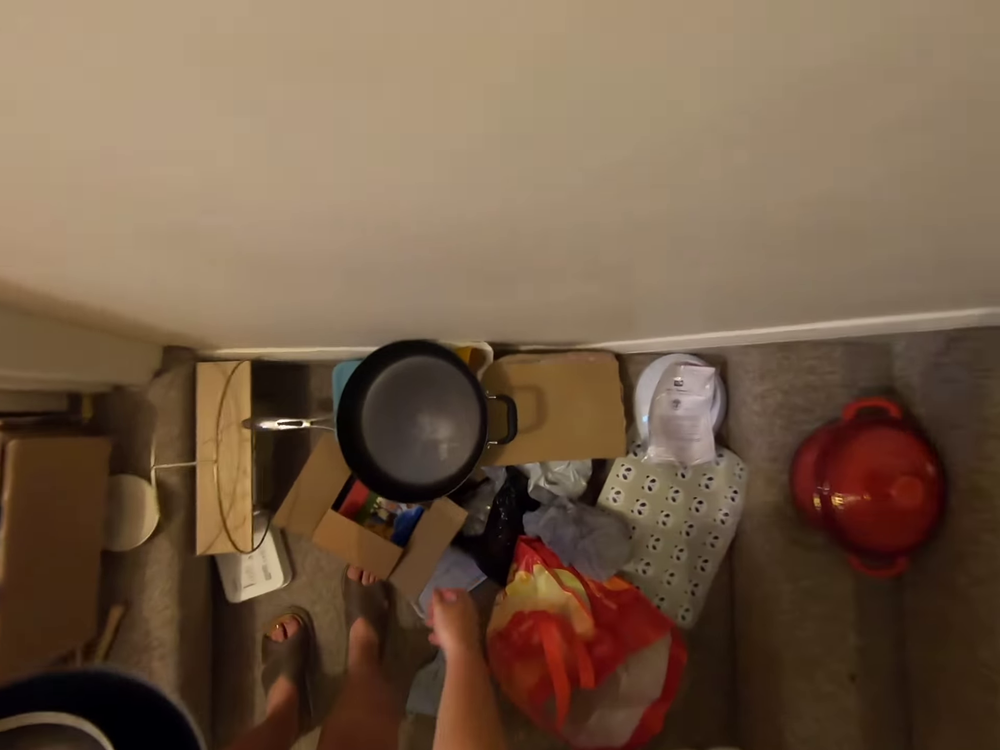

['a pan of food sitting on top of a table',
 'a person standing underneath some boxes with pots on it',
 'a person with a plate and various clutter next to a stove',
 'a room that has boxes, pots, and a person looking at a table with a '
 'magnifying glass',
 'someone holding a frying pan looking down at something in the air']


In [327]:
# API ref: https://github.com/salesforce/LAVIS/blob/480a9f382f0f4426fbb767b1803be924453fad0d/lavis/models/blip_models/blip_caption.py

ego4d_img = Image.fromarray(video_frames[0][:, :, ::-1], "RGB")
display(ego4d_img)

image = vis_processors["eval"](ego4d_img).unsqueeze(0).to(device)
lavis_caption = model.generate(
    {"image": image},
    num_beams=4,
    repetition_penalty=0.9,
    num_captions=5,
    use_nucleus_sampling=True,
)

pprint.pprint(lavis_caption)

Frame: pre_frame


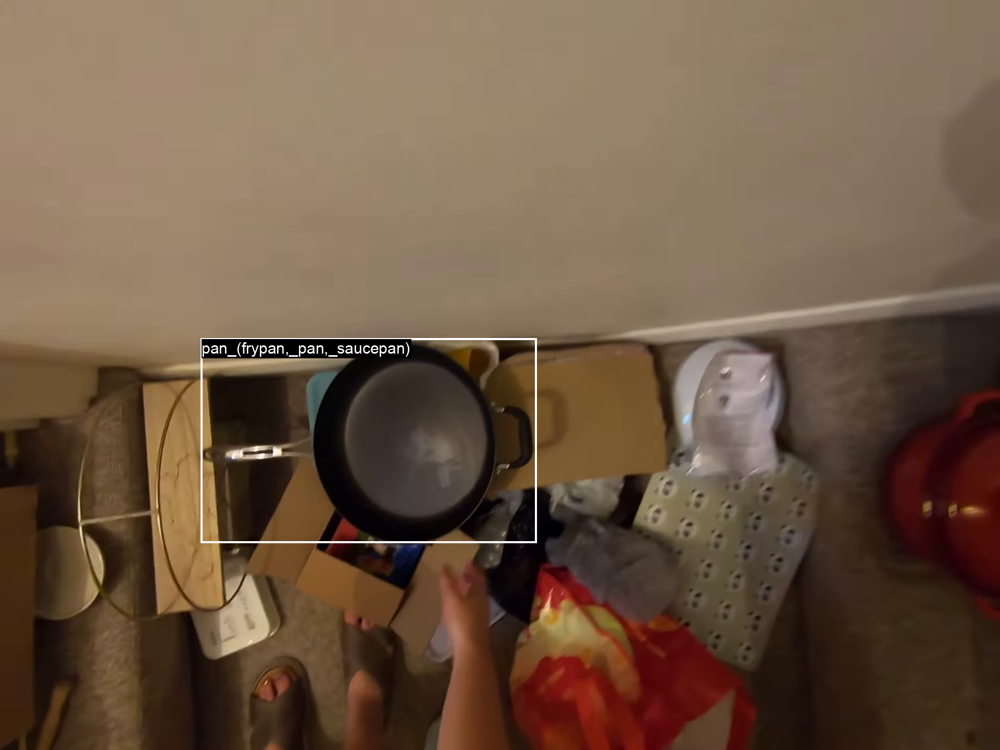

Frame: pnr_frame


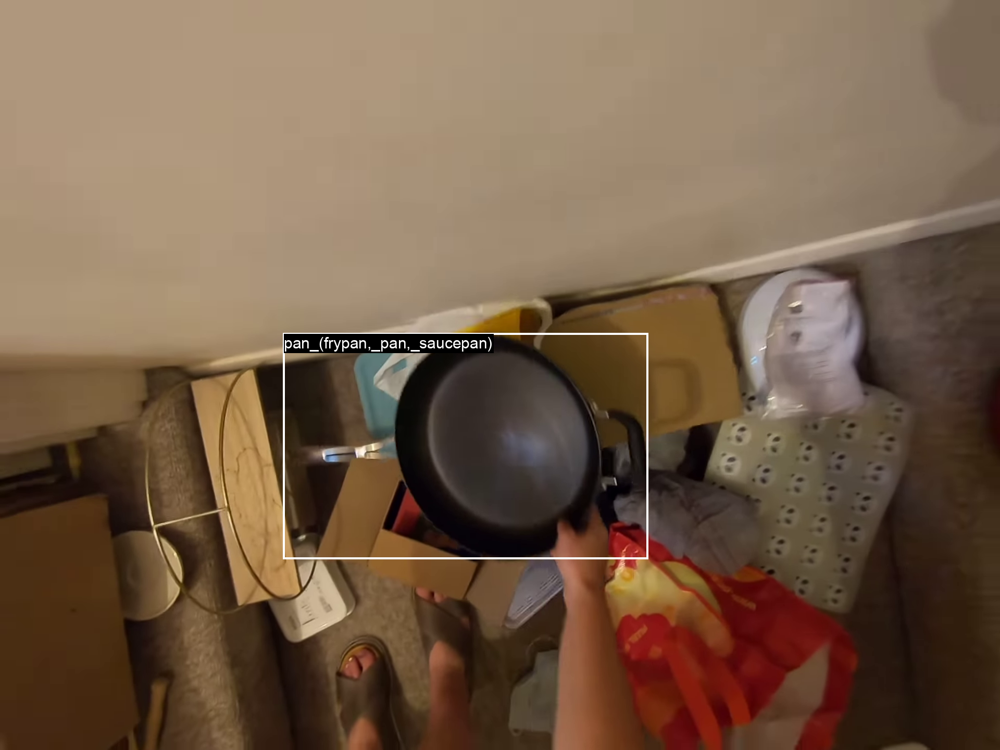

Frame: post_frame


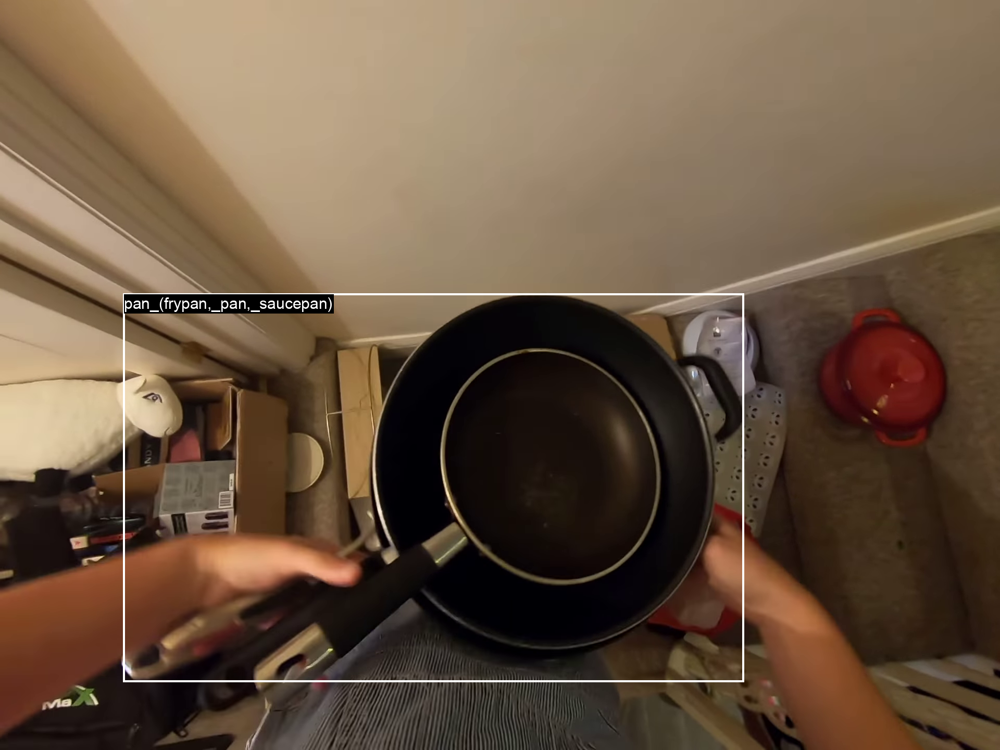

Active objects:
['pan_(frypan,_pan,_saucepan)',
 'pan_(frypan,_pan,_saucepan)',
 'pan_(frypan,_pan,_saucepan)']


In [328]:
frame_images = {
    "pre_frame":  "./media/pre_frame.png",
    "pnr_frame":  "./media/pnr_frame.png",
    "post_frame": "./media/post_frame.png",
}
list_of_active_objects = []

for frame in ["pre_frame", "pnr_frame", "post_frame"]:
    print("Frame: {}".format(frame))
    frame_image = frame_images[frame]
    for bbox_info in sampled_scod_clip[frame]["bbox"]:
        bbox = bbox_info["bbox"]
        if bbox_info["object_type"] == "object_of_change":
            list_of_active_objects.append(bbox_info["structured_noun"])
            bboxed_frame_image = draw_bbox_on_image(
                frame_image,
                [bbox["x"], bbox["y"], bbox["width"], bbox["height"]],
                bbox_info["structured_noun"],
                bbox_width=4,
                label_font_size=30,
            )
            # bboxed_frame_image = bboxed_frame_image.resize((512, 512), Image.Resampling.LANCZOS)
            display(bboxed_frame_image)

print("Active objects:")
pprint.pprint(list_of_active_objects)
# pprint.pprint(sampled_scod_clip)

In [41]:
# Indices: 
# ...

### For GLIP 

#### Essential Functions

In [8]:
def create_glip_config_file(
    narration,
    video_uid,
    frames_dict,
    glip_images_folder="../../GLIP/DATASET/ego4d/frames/test",
    glip_config_file_template="../../GLIP/configs/ego4d/ego4d_template.yaml",
    glip_config_file_output="../../GLIP/configs/ego4d/ego4d_test.yaml",
):
    narration_tokens = word_tokenize(narration)
    is_noun = lambda pos: pos[:2] == 'NN'
    narration_nouns = sorted(list(set([word for (word, pos) in nltk.pos_tag(narration_tokens) if is_noun(pos)])))
    if "C " in narration:
        narration_nouns.pop(narration_nouns.index("C"))

    print(narration)
    print(narration_nouns)

    override_category = []
    override_category_mapping = {}
    caption_prompt = []
    override_category_id = 1
    for noun in narration_nouns:
        override_category.append({
            "id": override_category_id,
            "name": noun,
            "supercategory": "objects",
        })
        override_category_mapping[override_category_id] = noun
        override_category_id += 1

        prefix = []
        name = []
        suffix = []
        now_suffix = False
        for token in narration_tokens:
            if token == noun:
                name.append(noun)
                now_suffix = True
            elif now_suffix:
                suffix.append(token)
            else:
                prefix.append(token)
        prefix = " ".join(prefix)
        name = " ".join(name)
        suffix = " ".join(suffix)
        caption_prompt.append({
            "prefix": prefix,
            "name": name,
            "suffix": suffix,
        })

    num_classes = len(narration_nouns)

    to_revise = {
        "CAPTION_PROMPT": str(caption_prompt),
        "OVERRIDE_CATEGORY": str(override_category),
        "NUM_CLASSES": str(num_classes+1)
    }

    pprint.pprint(to_revise)
    print(video_uid, pre_frame, pnr_frame, post_frame)

    # Copy frames to GLIP folder
    for frame in ["pre_frame", "pnr_frame", "post_frame"]:
        src_img = "./media/{}.png".format(frame)
        dst_img = os.path.join(
            glip_images_folder,
            "{}_{}.png".format(video_uid, frames_dict[frame])
        )
        print("Moving image from {} to {}".format(src_img, dst_img))
        shutil.copy(src_img, dst_img)

    glip_config_file_output = open(glip_config_file_output, "w")

    for line in open(glip_config_file_template):
        line = line.rstrip()
        for key in to_revise:
            if key in line and key != "NUM_CLASSES":
                line = line.replace("TODO", to_revise[key].replace("\'", "\""))
            elif key in line:
                line = "    NUM_CLASSES: {}".format(to_revise[key])
        glip_config_file_output.write(line+"\n")
    glip_config_file_output.close()
    
    return override_category, override_category_mapping, caption_prompt, narration_tokens

In [9]:
def create_glip_dataset_file(
    override_category,
    video_uid,
    frames_dict,
    coco_annots_test_json="../../GLIP/DATASET/ego4d/annotations/image_info_test-dev2017.json",
    output_dataset_file="../../GLIP/DATASET/ego4d/annotations/ego4d_test.json",
):
    coco_annots_test = json.load(open(coco_annots_test_json))
    print(coco_annots_test.keys())
    pprint.pprint(coco_annots_test["images"][0])

    new_d = {
        "info": coco_annots_test["info"],
        "images": [],
        "licenses": coco_annots_test["licenses"],
        "categories": override_category,
    }

    for frame in ["pre_frame", "pnr_frame", "post_frame"]:
        img = Image.open("./media/{}.png".format(frame))
        width = img.width
        height = img.height
        image_d = {
            "coco_url": "",
            "date_captured": "",
            "file_name": "{}_{}.png".format(video_uid, frames_dict[frame]),
            "height": height,
            "width": width,
            "license": 6,
            "id": "{}_{}".format(video_uid, frames_dict[frame]),
        }
        new_d["images"].append(image_d)

    json.dump(
        new_d,
        open(output_dataset_file, "w"),
        indent=4,
    )

In [10]:
def plot_glip_bboxes(
    video_uid,
    frames_dict,
    narration_tokens,
    override_category_mapping,
    top_k_bboxes=3,
    pred_bboxes_file ="../../GLIP/test_ego4d_eval_outputs/eval/glip_tiny_model_o365_goldg_cc_sbu/inference/test/bbox.json",
    glip_images_folder="../../GLIP/DATASET/ego4d/frames/test",
    resize_image_width=None,
):
    pred_bboxes = json.load(open(pred_bboxes_file))
    pred_bboxes_on_images = {}
    for bbox in pred_bboxes:
        image_id = bbox["image_id"]
        img_path = os.path.join(
            glip_images_folder,
            "{}.png".format(image_id)
        )
        assert os.path.exists(img_path)
        if image_id not in pred_bboxes_on_images:
            pred_bboxes_on_images[image_id] = {
                "img_path": img_path,
                "bboxes": []
            }
        pred_bboxes_on_images[image_id]["bboxes"].append({
            "score": bbox["score"],
            "bbox": bbox["bbox"],
            "label": override_category_mapping[bbox["category_id"]]
        })

    for image_id in pred_bboxes_on_images:
        pred_bboxes_on_images[image_id]["bboxes"] = sorted(
            pred_bboxes_on_images[image_id]["bboxes"],
            key=lambda x: x["score"],
            reverse=True
        )

    # pprint.pprint(pred_bboxes_on_images)

    for frame in ["pre_frame", "pnr_frame", "post_frame"]:
        _img = os.path.join(
            glip_images_folder,
            "{}_{}.png".format(video_uid, frames_dict[frame])
        )
        frame_images[frame] = _img

    for frame in ["pre_frame", "pnr_frame", "post_frame"]:
        print("Frame: {}".format(frame))
        print("Narrations: {}".format(narration_tokens))
        frame_image = Image.open(frame_images[frame])
        frame_image_id = "{}_{}".format(video_uid, frames_dict[frame])
        bboxes = pred_bboxes_on_images[frame_image_id]["bboxes"]
        bboxed_frame_image = frame_image
        for bbox_info in bboxes[:top_k_bboxes]:
            bbox = bbox_info["bbox"]
            bboxed_frame_image = draw_bbox_on_image(
                bboxed_frame_image,
                [bbox[0], bbox[1], bbox[2], bbox[3]],
                bbox_info["label"]+": {:.4f}".format(bbox_info["score"]),
                bbox_width=4,
                label_font_size=30,
            )
        if (
            resize_image_width is not None
            and (type(resize_image_width) is int or
                 type(resize_image_width) is float)
        ):
            wpercent = (resize_image_width / float(bboxed_frame_image.size[0]))
            hsize = int((float(bboxed_frame_image.size[1]) * float(wpercent)))
            bboxed_frame_image = bboxed_frame_image.resize((resize_image_width, hsize), Image.Resampling.LANCZOS)
        display(bboxed_frame_image)

In [11]:
def glip_inference_for_bboxes(
    narration,
    video_uid,
    frames_dict,
    glip_images_folder="../../GLIP/DATASET/ego4d/frames/test",
    glip_config_file_template="../../GLIP/configs/ego4d/ego4d_template.yaml",
    glip_config_file_output="../../GLIP/configs/ego4d/ego4d_test.yaml",
    coco_annots_test_json="../../GLIP/DATASET/ego4d/annotations/image_info_test-dev2017.json",
    output_dataset_file="../../GLIP/DATASET/ego4d/annotations/ego4d_test.json",
    run_glip_commands=[
        "sh run_glip.sh",
    ],
    pred_bboxes_file="../../GLIP/test_ego4d_eval_outputs/eval/glip_tiny_model_o365_goldg_cc_sbu/inference/test/bbox.json",
    top_k_bboxes=3,
    resize_image_width=None,
):
    (override_category,
     override_category_mapping,
     caption_prompt,
     narration_tokens) = create_glip_config_file(
        narration,
        video_uid,
        frames_dict,
        glip_images_folder=glip_images_folder,
        glip_config_file_template=glip_config_file_template,
        glip_config_file_output=glip_config_file_output,
    )

    create_glip_dataset_file(
        override_category,
        video_uid,
        frames_dict,
        coco_annots_test_json=coco_annots_test_json,
        output_dataset_file=output_dataset_file,
    )

    for cmd in run_glip_commands:
        os.system(cmd)
    clear_output()

    plot_glip_bboxes(
        video_uid,
        frames_dict,
        narration_tokens,
        override_category_mapping,
        top_k_bboxes=top_k_bboxes,
        pred_bboxes_file=pred_bboxes_file,
        glip_images_folder=glip_images_folder,
        resize_image_width=resize_image_width,
    )

#### Testing

In [268]:
glip_images_folder = "../../GLIP/DATASET/ego4d/frames/test"
glip_config_file_template = "../../GLIP/configs/ego4d/ego4d_template.yaml"
glip_config_file_output = "../../GLIP/configs/ego4d/ego4d_test.yaml"
# Write some narrations.
narration = closest_narrations[0][-1].split("#C ")[-1].strip()
narration = "The carabiner is now in the possession of the person who removed it from the hook."

(override_category,
 override_category_mapping,
 caption_prompt,
 narration_tokens) = create_glip_config_file(
    narration,
    video_uid,
    frames_dict,
    glip_images_folder=glip_images_folder,
    glip_config_file_template=glip_config_file_template,
    glip_config_file_output=glip_config_file_output,
)

The carabiner is now in the possession of the person who removed it from the hook.
['carabiner', 'hook', 'person', 'possession']
{'CAPTION_PROMPT': "[{'prefix': 'The', 'name': 'carabiner', 'suffix': 'is now "
                   'in the possession of the person who removed it from the '
                   "hook .'}, {'prefix': 'The carabiner is now in the "
                   "possession of the person who removed it from the', 'name': "
                   "'hook', 'suffix': '.'}, {'prefix': 'The carabiner is now "
                   "in the possession of the', 'name': 'person', 'suffix': "
                   "'who removed it from the hook .'}, {'prefix': 'The "
                   "carabiner is now in the', 'name': 'possession', 'suffix': "
                   "'of the person who removed it from the hook .'}]",
 'NUM_CLASSES': '5',
 'OVERRIDE_CATEGORY': "[{'id': 1, 'name': 'carabiner', 'supercategory': "
                      "'objects'}, {'id': 2, 'name': 'hook', 'supercategory': "
     

In [269]:
coco_annots_test_json = "../../GLIP/DATASET/ego4d/annotations/image_info_test-dev2017.json"
output_dataset_file = "../../GLIP/DATASET/ego4d/annotations/ego4d_test.json"
run_glip_commands=[
    "sh run_glip.sh",
]

create_glip_dataset_file(
    override_category,
    video_uid,
    frames_dict,
    coco_annots_test_json=coco_annots_test_json,
    output_dataset_file=output_dataset_file,
)

for cmd in run_glip_commands:
    os.system(cmd)
clear_output()

In [ ]:
pred_bboxes_file = "../../GLIP/test_ego4d_eval_outputs/eval/glip_tiny_model_o365_goldg_cc_sbu/inference/test/bbox.json"
top_k_bboxes = 3

plot_glip_bboxes(
    video_uid,
    frames_dict,
    top_k_bboxes=top_k_bboxes,
    pred_bboxes_file=pred_bboxes_file,
    glip_images_folder=glip_images_folder,
    resize_image_width=800,
)

Frame: pre_frame
Narrations: ['C', 'removes', 'carabiner', 'from', 'the', 'hook']


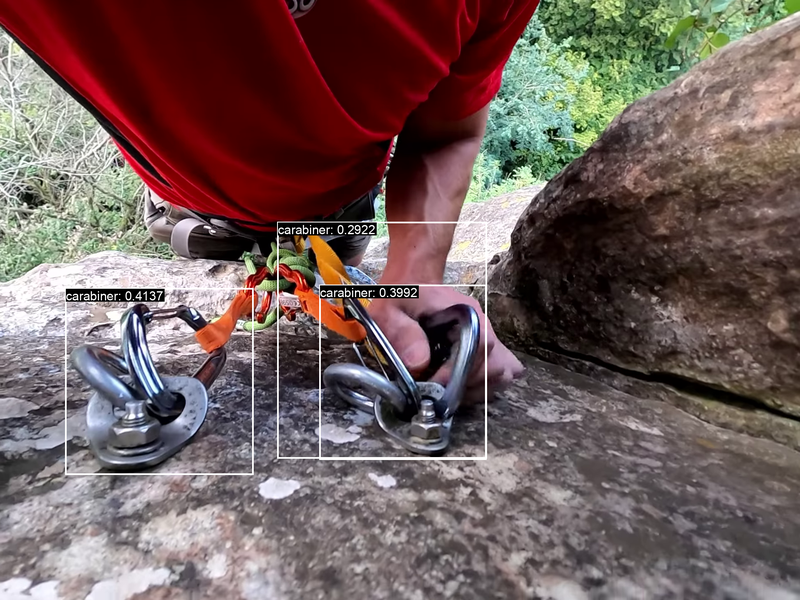

Frame: pnr_frame
Narrations: ['C', 'removes', 'carabiner', 'from', 'the', 'hook']


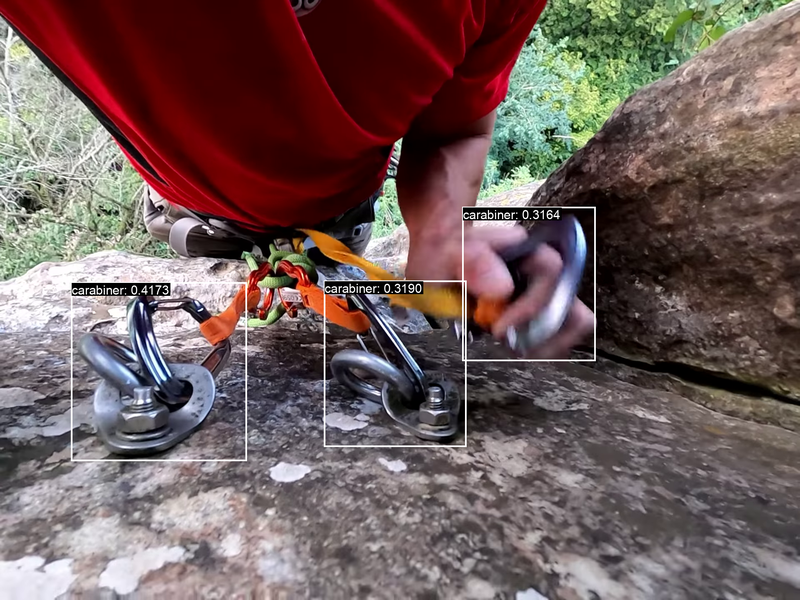

Frame: post_frame
Narrations: ['C', 'removes', 'carabiner', 'from', 'the', 'hook']


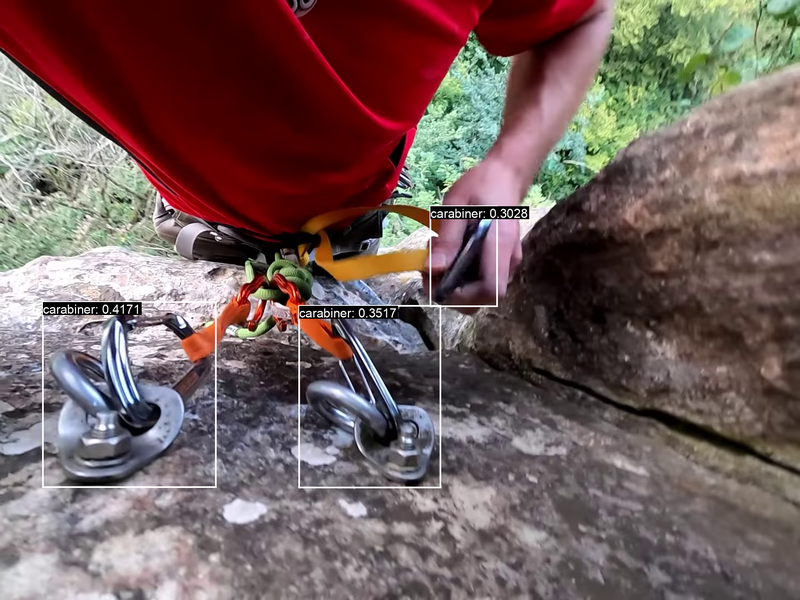

In [294]:
glip_images_folder = "../../GLIP/DATASET/ego4d/frames/test"
glip_config_file_template = "../../GLIP/configs/ego4d/ego4d_template.yaml"
glip_config_file_output = "../../GLIP/configs/ego4d/ego4d_test.yaml"
coco_annots_test_json = "../../GLIP/DATASET/ego4d/annotations/image_info_test-dev2017.json"
output_dataset_file = "../../GLIP/DATASET/ego4d/annotations/ego4d_test.json"
run_glip_commands=[
    "sh run_glip.sh",
]
pred_bboxes_file = "../../GLIP/test_ego4d_eval_outputs/eval/glip_tiny_model_o365_goldg_cc_sbu/inference/test/bbox.json"
top_k_bboxes = 3
# Write some narrations.
narration = closest_narrations[0][-1].split("#C ")[-1].strip()

glip_inference_for_bboxes(
    narration,
    video_uid,
    frames_dict,
    glip_images_folder=glip_images_folder,
    glip_config_file_template=glip_config_file_template,
    glip_config_file_output=glip_config_file_output,
    coco_annots_test_json=coco_annots_test_json,
    output_dataset_file=output_dataset_file,
    run_glip_commands=run_glip_commands,
    pred_bboxes_file=pred_bboxes_file,
    top_k_bboxes=top_k_bboxes,
    resize_image_width=800,
)

Frame: pre_frame
Narrations: ['The', 'carabiner', 'is', 'now', 'in', 'the', 'possession', 'of', 'the', 'person', 'who', 'removed', 'it', 'from', 'the', 'hook', '.']


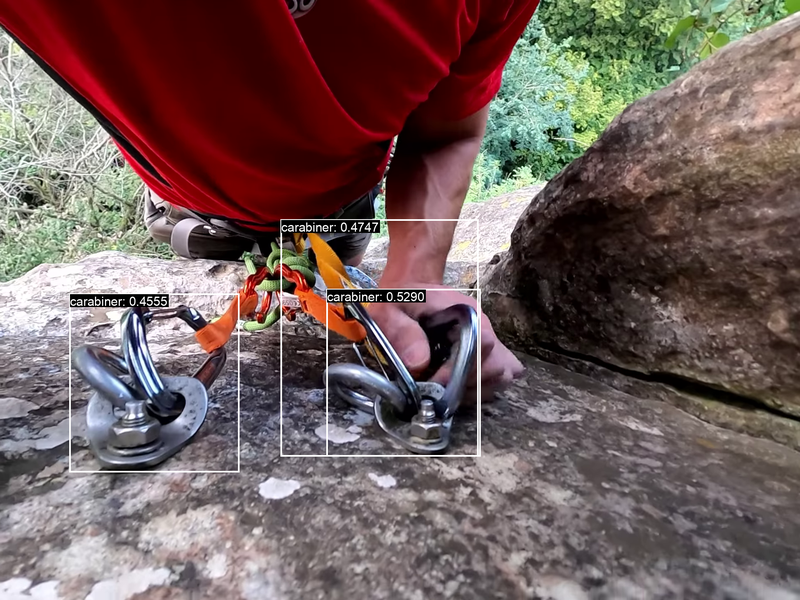

Frame: pnr_frame
Narrations: ['The', 'carabiner', 'is', 'now', 'in', 'the', 'possession', 'of', 'the', 'person', 'who', 'removed', 'it', 'from', 'the', 'hook', '.']


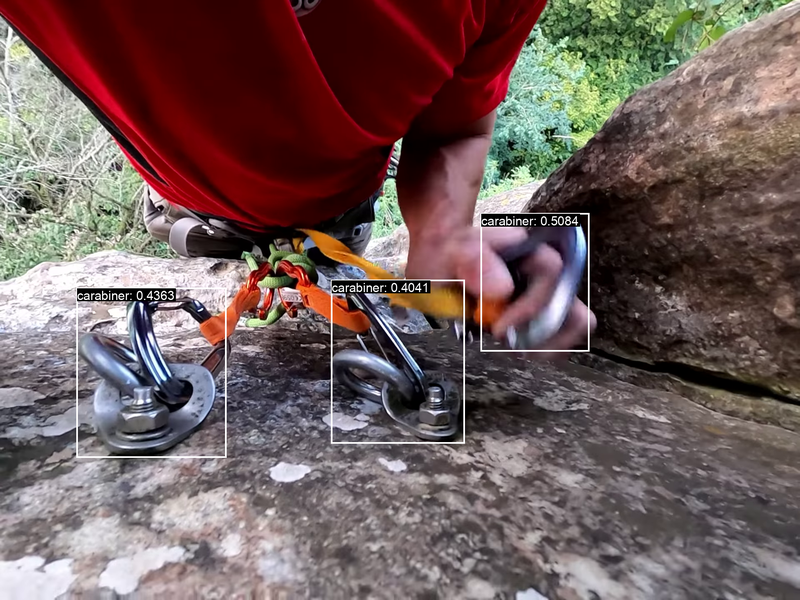

Frame: post_frame
Narrations: ['The', 'carabiner', 'is', 'now', 'in', 'the', 'possession', 'of', 'the', 'person', 'who', 'removed', 'it', 'from', 'the', 'hook', '.']


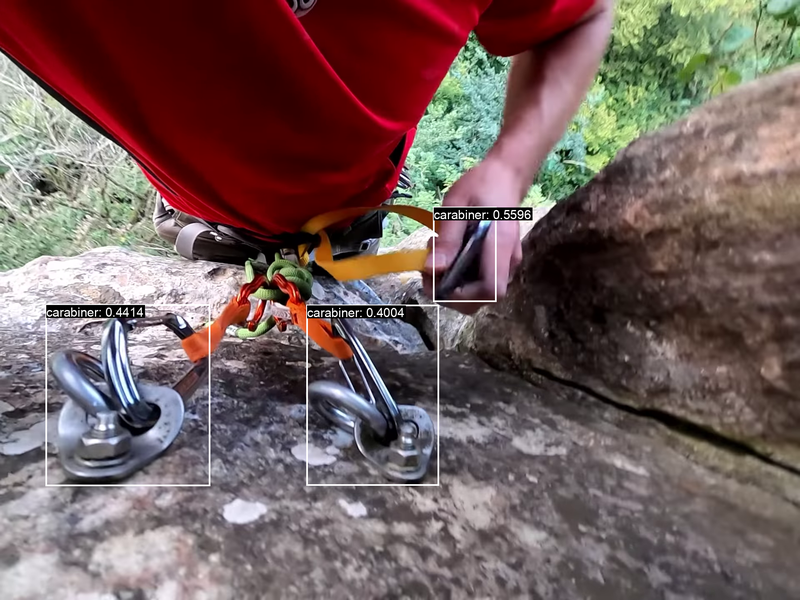

In [293]:
narration = "The carabiner is now in the possession of the person who removed it from the hook."


glip_inference_for_bboxes(
    narration,
    video_uid,
    frames_dict,
    glip_images_folder=glip_images_folder,
    glip_config_file_template=glip_config_file_template,
    glip_config_file_output=glip_config_file_output,
    coco_annots_test_json=coco_annots_test_json,
    output_dataset_file=output_dataset_file,
    run_glip_commands=run_glip_commands,
    pred_bboxes_file=pred_bboxes_file,
    top_k_bboxes=top_k_bboxes,
    resize_image_width=800,
)

Frame: pre_frame
Narrations: ['C', 'picks', 'up', 'another', 'frying', 'pan', 'from', 'the', 'box']


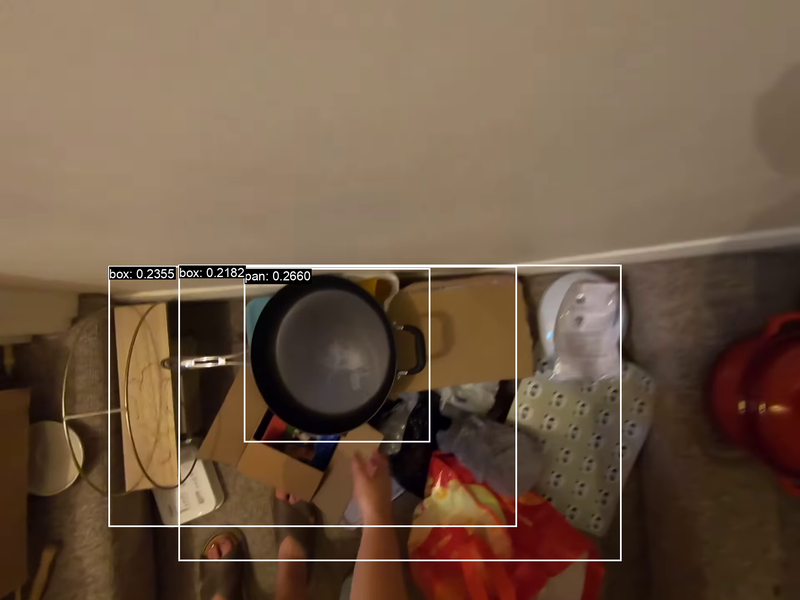

Frame: pnr_frame
Narrations: ['C', 'picks', 'up', 'another', 'frying', 'pan', 'from', 'the', 'box']


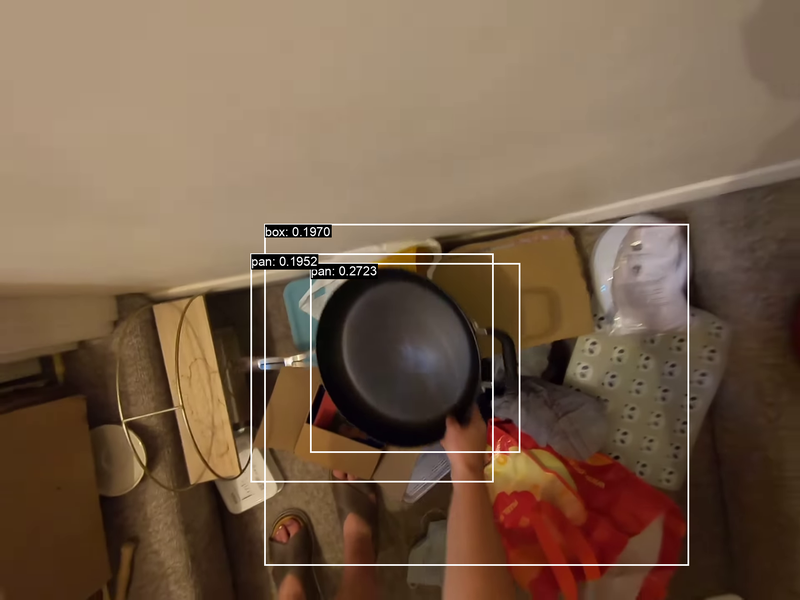

Frame: post_frame
Narrations: ['C', 'picks', 'up', 'another', 'frying', 'pan', 'from', 'the', 'box']


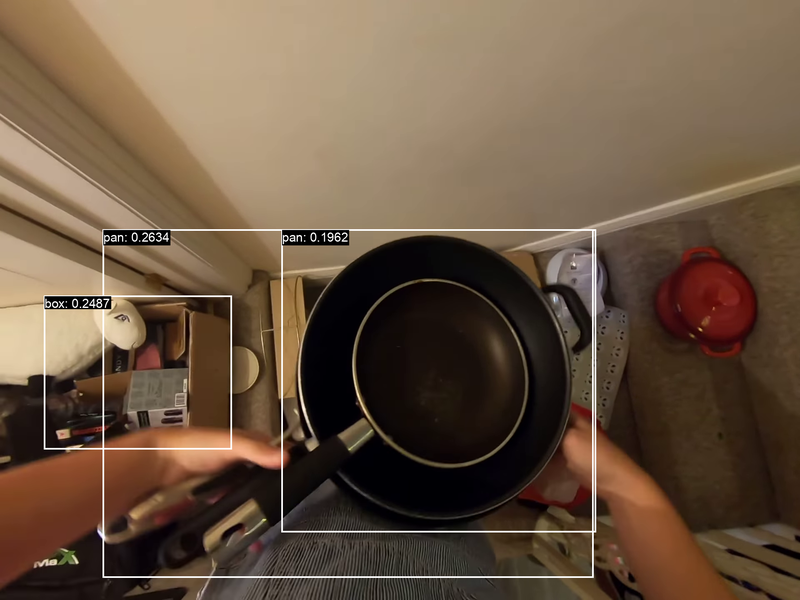

In [333]:
glip_images_folder = "../../GLIP/DATASET/ego4d/frames/test"
glip_config_file_template = "../../GLIP/configs/ego4d/ego4d_template.yaml"
glip_config_file_output = "../../GLIP/configs/ego4d/ego4d_test.yaml"
coco_annots_test_json = "../../GLIP/DATASET/ego4d/annotations/image_info_test-dev2017.json"
output_dataset_file = "../../GLIP/DATASET/ego4d/annotations/ego4d_test.json"
run_glip_commands=[
    "sh run_glip.sh",
]
pred_bboxes_file = "../../GLIP/test_ego4d_eval_outputs/eval/glip_tiny_model_o365_goldg_cc_sbu/inference/test/bbox.json"
top_k_bboxes = 3
# Write some narrations.
narration = closest_narrations[0][-1].split("#C ")[-1].strip()


glip_inference_for_bboxes(
    narration,
    video_uid,
    frames_dict,
    glip_images_folder=glip_images_folder,
    glip_config_file_template=glip_config_file_template,
    glip_config_file_output=glip_config_file_output,
    coco_annots_test_json=coco_annots_test_json,
    output_dataset_file=output_dataset_file,
    run_glip_commands=run_glip_commands,
    pred_bboxes_file=pred_bboxes_file,
    top_k_bboxes=top_k_bboxes,
    resize_image_width=800,
)

Frame: pre_frame
Narrations: ['The', 'frying', 'pan', 'is', 'now', 'in', 'the', 'possession', 'of', 'the', 'person', 'who', 'performed', 'the', 'action', '.']


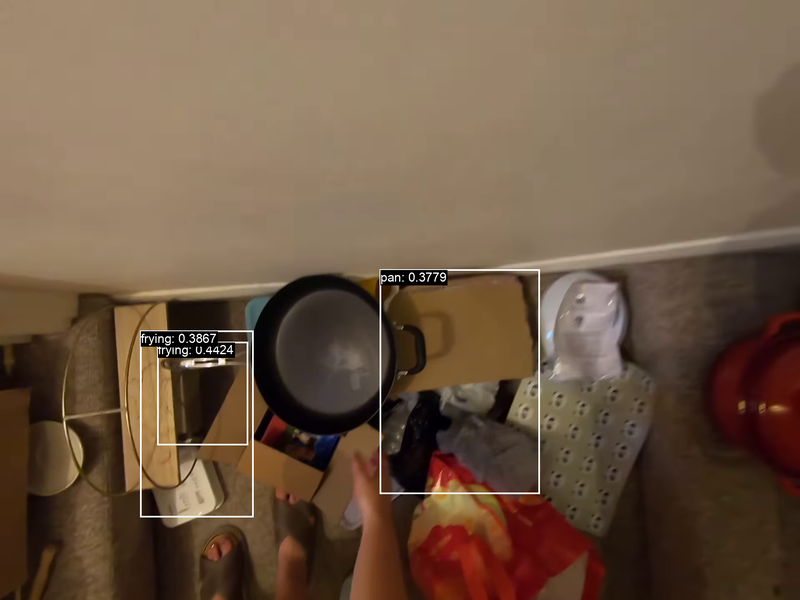

Frame: pnr_frame
Narrations: ['The', 'frying', 'pan', 'is', 'now', 'in', 'the', 'possession', 'of', 'the', 'person', 'who', 'performed', 'the', 'action', '.']


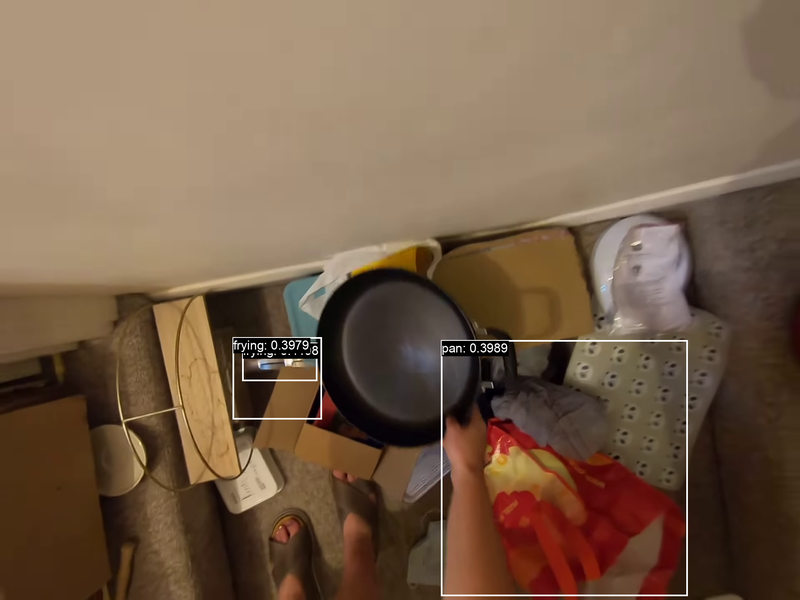

Frame: post_frame
Narrations: ['The', 'frying', 'pan', 'is', 'now', 'in', 'the', 'possession', 'of', 'the', 'person', 'who', 'performed', 'the', 'action', '.']


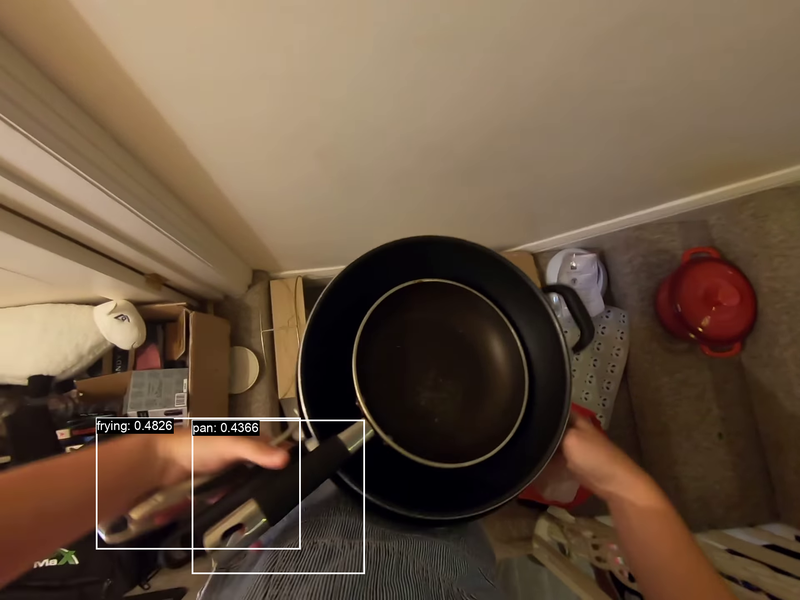

In [334]:
narration = "The frying pan is now in the possession of the person who performed the action."


glip_inference_for_bboxes(
    narration,
    video_uid,
    frames_dict,
    glip_images_folder=glip_images_folder,
    glip_config_file_template=glip_config_file_template,
    glip_config_file_output=glip_config_file_output,
    coco_annots_test_json=coco_annots_test_json,
    output_dataset_file=output_dataset_file,
    run_glip_commands=run_glip_commands,
    pred_bboxes_file=pred_bboxes_file,
    top_k_bboxes=top_k_bboxes,
    resize_image_width=800,
)

## STA

In [522]:
sta_annots_test = "fho_sta_val.json"
sta_annots_test = os.path.join(annots_root, sta_annots_test)
sta_annots = json.load(open(sta_annots_test))

print(len(sta_annots["annotations"]))

17217


In [523]:
print(sta_annots.keys())

annot_idx = np.random.choice(len(sta_annots["annotations"]))
pprint.pprint(sta_annots["info"].keys())
noun_cats = {}
verb_cats = {}
for cat in sta_annots["noun_categories"]:
    noun_cats[cat["id"]] = cat["name"]
for cat in sta_annots["verb_categories"]:
    verb_cats[cat["id"]] = cat["name"]
pprint.pprint(sta_annots["info"]["video_metadata"][sta_annots["annotations"][annot_idx]["video_id"]])
for bbox_idx in range(len(sta_annots["annotations"][annot_idx]["objects"])):
    sta_annots["annotations"][annot_idx]["objects"][bbox_idx]["verb"] = \
        verb_cats[sta_annots["annotations"][annot_idx]["objects"][bbox_idx]["verb_category_id"]]
    sta_annots["annotations"][annot_idx]["objects"][bbox_idx]["noun"] = \
        noun_cats[sta_annots["annotations"][annot_idx]["objects"][bbox_idx]["noun_category_id"]]
pprint.pprint(sta_annots["annotations"][annot_idx])
sta_frame_number = sta_annots["annotations"][annot_idx]["frame"]
video_uid = sta_annots["annotations"][annot_idx]["video_id"]
print(video_uid, sta_frame_number)

dict_keys(['info', 'annotations', 'noun_categories', 'verb_categories'])
dict_keys(['description', 'version', 'split', 'include_annotations', 'video_metadata', 'year', 'date_created'])
{'fps': 30.0, 'frame_height': 1440, 'frame_width': 1920}
{'clip_frame': 2953,
 'clip_id': 849,
 'clip_uid': '58b07e66-1a47-4c98-a96e-60109be8650b',
 'frame': 11712,
 'objects': [{'box': [422.3, 706.02, 939.9100000000001, 941.8],
              'noun': 'pot',
              'noun_category_id': 56,
              'time_to_contact': 0.13333333333333333,
              'verb': 'take_(pick,_grab,_get)',
              'verb_category_id': 62}],
 'uid': 'e636dd8b-7682-4910-8b26-781f192c37ec_0011712',
 'video_id': 'e636dd8b-7682-4910-8b26-781f192c37ec'}
e636dd8b-7682-4910-8b26-781f192c37ec 11712


In [524]:
downloaded_video_id_and_paths = {
    x.split(".mp4")[0]: os.path.join(curr_videos_root, x)
    for x in os.listdir(curr_videos_root) if ".mp4" in x
}
print("Currently we downloaded {} ego4d videos.".format(len(downloaded_video_id_and_paths)))

downloaded_sta_annots = []
for idx in range(len(sta_annots["annotations"])):
    video_uid = sta_annots["annotations"][idx]["video_id"]
    if video_uid in downloaded_video_id_and_paths:
        downloaded_sta_annots.append(sta_annots["annotations"][idx])
print(len(downloaded_sta_annots))

Currently we downloaded 779 ego4d videos.
1009


In [570]:
sta_rand_idx = np.random.choice(len(downloaded_sta_annots))
# sta_rand_idx = 874
sta_rand_idx = 465
print(sta_rand_idx)

curr_downloaded_sta_annots = downloaded_sta_annots[sta_rand_idx]
pprint.pprint(curr_downloaded_sta_annots)

video_uid = curr_downloaded_sta_annots["video_id"]
sta_frame_number = curr_downloaded_sta_annots["frame"]

curr_videos_root = "/local1/jrbronkar/ego4d_videos/v1/full_scale"
ego4d_video_path = os.path.join(
    curr_videos_root,
    "{}.mp4".format(video_uid),
)
print("Mother video: {}".format(ego4d_video_path))
assert os.path.exists(ego4d_video_path)
frame_name = "sta_demo"
narration_pass = "narration_pass_1"
fps = 30

ffmpeg_frame_cmd = (
    "/home/telinwu/ffmpeg-git-20220910-amd64-static/ffmpeg "
    "-i {} "
    "-vf select='between(n\,{}\,{})' -vsync 0 "
    "-loglevel panic ./media/{}.png".format(
        ego4d_video_path,
        sta_frame_number,
        sta_frame_number,
        frame_name,
    )
)

curr_narrations = all_narrations[video_uid][narration_pass]["narrations"]
min_future_frame = 1e12
curr_frame = curr_downloaded_sta_annots["frame"]
for obj in curr_downloaded_sta_annots["objects"]:
    min_future_frame = min(min_future_frame, int(obj["time_to_contact"]*fps))
min_future_frame += curr_frame

closest_before_sta_narrations = []
closest_after_sta_narrations = []
for i in range(len(curr_narrations)-1):
    narration_text = curr_narrations[i]["narration_text"]
    timestamp_sec = curr_narrations[i]["timestamp_sec"]
    timestamp_frame = curr_narrations[i]["timestamp_frame"]
    next_timestamp_frame = curr_narrations[i+1]["timestamp_frame"]
    if (
        next_timestamp_frame <= curr_frame
    ):
        closest_before_sta_narrations.append((
            timestamp_sec, timestamp_frame, narration_text
        ))
    elif (
        timestamp_frame >= min_future_frame
    ):
        closest_after_sta_narrations.append((
            timestamp_sec, timestamp_frame, narration_text,
        ))

closest_before_sta_narrations = sorted(closest_before_sta_narrations, reverse=True)[:5]
closest_before_sta_narrations = [(a, b, c) for a, b, c in closest_before_sta_narrations]
closest_after_sta_narrations = sorted(closest_after_sta_narrations, reverse=False)[:5]
closest_after_sta_narrations = [(a, b, c) for a, b, c in closest_after_sta_narrations]

# raise

if os.path.exists("./media/sta_demo.png"):
    os.remove("./media/sta_demo.png")
print("Executed command: {}".format(ffmpeg_frame_cmd))
os.system(ffmpeg_frame_cmd)

465
{'clip_frame': 2877,
 'clip_id': 818,
 'clip_uid': 'f5613680-1dbc-4945-8a77-949098bc13dd',
 'frame': 2877,
 'objects': [{'box': [1065.32, 3.45, 1365.75, 414.39],
              'noun_category_id': 5,
              'time_to_contact': 0.7333333333333333,
              'verb_category_id': 62},
             {'box': [623.31, 742.45, 1006.6199999999999, 1125.76],
              'noun_category_id': 5,
              'time_to_contact': 0.7333333333333333,
              'verb_category_id': 62}],
 'uid': '7b016e40-d10a-43b3-9222-cb4787a95432_0002877',
 'video_id': '7b016e40-d10a-43b3-9222-cb4787a95432'}
Mother video: /local1/jrbronkar/ego4d_videos/v1/full_scale/7b016e40-d10a-43b3-9222-cb4787a95432.mp4
Executed command: /home/telinwu/ffmpeg-git-20220910-amd64-static/ffmpeg -i /local1/jrbronkar/ego4d_videos/v1/full_scale/7b016e40-d10a-43b3-9222-cb4787a95432.mp4 -vf select='between(n\,2877\,2877)' -vsync 0 -loglevel panic ./media/sta_demo.png


0

--------------------------------------------------
Before STA Frame
[0:01:19.13](2374) #C C pours detergent in the lid
[0:01:24.45](2533) #C C pours detergent in the washing machine
[0:01:27.23](2616) #C C pours detergent in the lid
[0:01:30.54](2716) #C C pours detergent in the washing machine
[0:01:34.02](2820) #C C knocks a lid on the washing machine
STA frame: 2877
After STA Frame
[0:01:37.26](2917) #C C picks a detergent from the drawer
[0:01:37.82](2934) #C C opens the lid
[0:01:39.61](2988) #C C pours detergent in a lid
[0:01:44.73](3141) #C C places detergent in the washing machine
[0:01:46.90](3207) #C C knocks a lid on the washing machine
--------------------------------------------------


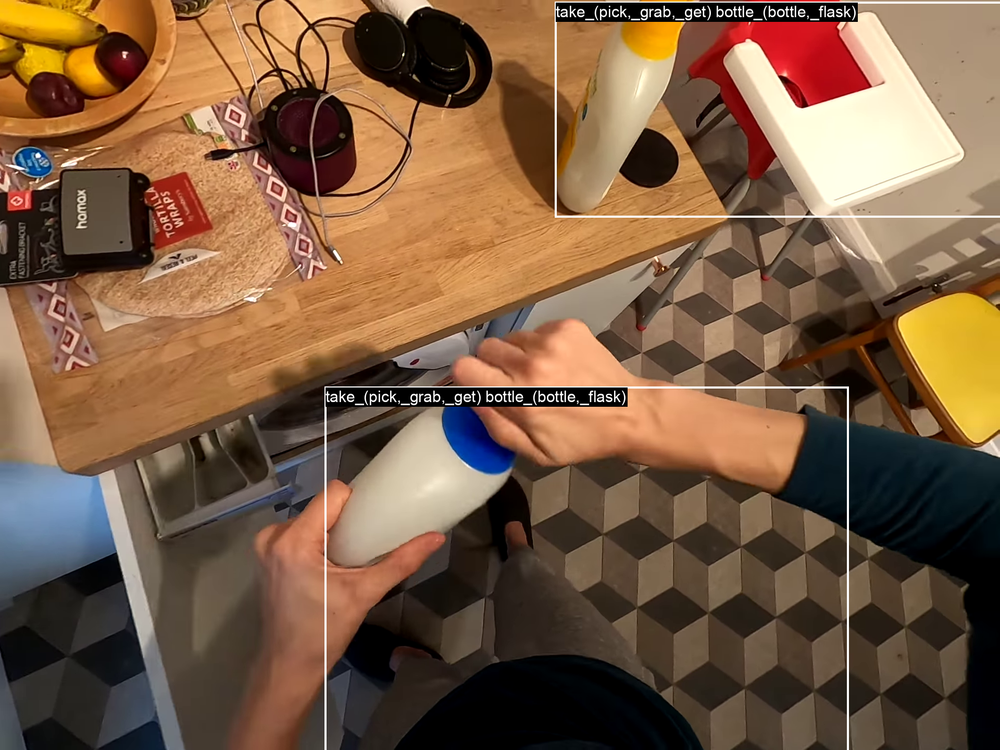

In [588]:
noun_id = curr_downloaded_sta_annots["objects"][0]["noun_category_id"]
verb_id = curr_downloaded_sta_annots["objects"][0]["verb_category_id"]
noun = noun_cats[noun_id]
verb = verb_cats[verb_id]

print("-"*50)
print("Before STA Frame")
for a, b, c in sorted(closest_before_sta_narrations, key=lambda x: int(x[1])):
    print("[{}]({}) {}".format(str(datetime.timedelta(seconds=a))[:10], b, c))
print("STA frame: {}".format(curr_frame))
print("After STA Frame")
for a, b, c in sorted(closest_after_sta_narrations, key=lambda x: int(x[1])):
    print("[{}]({}) {}".format(str(datetime.timedelta(seconds=a))[:10], b, c))
print("-"*50)

bboxed_frame_image = Image.open("./media/sta_demo.png")
for bbox_info in curr_downloaded_sta_annots["objects"]:
    bbox = bbox_info["box"]
    bboxed_frame_image = draw_bbox_on_image(
        bboxed_frame_image,
        bbox,
        "{} {}".format(verb, noun),
        bbox_width=4,
        label_font_size=30,
    )
# bboxed_frame_image = bboxed_frame_image.resize((512, 512), Image.Resampling.LANCZOS)
display(bboxed_frame_image)

### Large-Scale GLIP

In [286]:
from run_glip_baseline_on_ego4d import coco_eval_results

curr_videos_root = "/local1/hu528/ego4d_data/v1/full_scale"

In [269]:
# Use the {video_uid}_{pnr_frame} as key to organize the scod clip annotation

keyed_scod_clips = {}
for scod_clip in downloaded_scod_clips:
    video_uid = scod_clip["video_uid"]
    pnr_frame = scod_clip["pnr_frame"]["frame_number"]
    key = "{}_{}".format(video_uid, pnr_frame)
    keyed_scod_clips[key] = scod_clip

#### Essential Functions

In [303]:
def compare_glip_results(files, frame_keys, top_k, first_k=None):
    res = {}
    all_keyed_results = {}
    for file in files:
        res[file] = {
            "Metrics": None
        }
        file_for_coco = file
        if type(files) is dict:
            file_for_coco = {file: files[file]}
        all_metrics, avg_metrics, keyed_results = coco_eval_results(
            file_for_coco,
            top_k=top_k,
            verbose=False,
            first_k=None,
            frame_keys=frame_keys,
        )
        res[file]["Metrics"] = avg_metrics
        all_keyed_results[file] = keyed_results
    
    for file in res:
        print("---- {} ----".format(file))
        pprint.pprint(res[file]["Metrics"])
        
    return all_keyed_results


def make_keyed_glip_results(
    output_results_json_file,
    frame_keys=["pre", "pnr", "post"],
):
    output_results = json.load(open(output_results_json_file))
    res_dict = {}
    for res in output_results:
        video_uid = None
        keys = []
        for fr in frame_keys:
            if "{}_frame".format(fr) not in res:
                continue
            curr = res["{}_frame".format(fr)]
            if video_uid is None:
                video_uid = curr["video_uid"]
                keys.append(video_uid)
            frame_cnt = curr["frame_cnt"]
            keys.append(str(frame_cnt))
        if video_uid is None:
            continue
        key = "_".join(keys)
        res_dict[key] = res
    return res_dict


def visualize_glip_results_comparisons(
    named_result_tuple_list,
    top_k_bboxes=3,
    resize_image_width=None,
    frame_keys=["pre", "pnr", "post"],
    bbox_width=4,
    label_font_size=30,
    scod_clip=None,
    image_folder="/local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/pre_pnr_post_png_frames",
):
    if scod_clip is not None:
        video_uid = scod_clip["video_uid"]
    for frame_prefix in frame_keys:
        print("-"*50)
        frame = "{}_frame".format(frame_prefix)
        print("{} {}".format(bold_text(red_text("Frame:")), red_text(frame)))
        for name, res in named_result_tuple_list:
            image_path = None
            if frame not in res:
                if scod_clip is not None:
                    scod_frame_number = scod_clip[frame]["frame_number"]
                    image_path = os.path.join(image_folder, video_uid, "{}.png".format(scod_frame_number))
                    gt_bboxes = []
                    for bbox in scod_clip[frame]["bbox"]:
                        if bbox["object_type"] == "object_of_change":
                            gt_bboxes.append(bbox)
            else:
                frame_res = res[frame]
                narration_tokens = frame_res["narration_tokens"]
                print("{} {}".format(bold_text(blue_text("Method:")), blue_text(name)))
                print("{} {}".format(bold_text(magenta_text("Used Narrations (if any):")),
                                     magenta_text(str(narration_tokens))))
                image_path = os.path.join(frame_res["image_folder"], frame_res["image_name"])
                assert os.path.exists(image_path)
                gt_bboxes = frame_res["gt_bboxes"]
                if len(gt_bboxes) == 0:
                    print(red_text("No GT Bboxs for this frame!"))
            
            if image_path is None:
                continue
            frame_image = Image.open(image_path)
            bboxed_frame_image = frame_image
            
            for bbox_info in gt_bboxes:
                bbox = bbox_info["bbox"]
                bboxed_frame_image = draw_bbox_on_image(
                    bboxed_frame_image,
                    [bbox["x"], bbox["y"], bbox["width"], bbox["height"]],
                    bbox_info["structured_noun"],
                    bbox_width=bbox_width,
                    label_font_size=label_font_size,
                    outline_color="red"
                )

            if frame in res:
                bboxes = frame_res["pred_bboxes"]
                for bbox_info in bboxes[:top_k_bboxes]:
                    bbox = bbox_info["bbox"]
                    if "label" not in bbox_info:
                        continue
                    bboxed_frame_image = draw_bbox_on_image(
                        bboxed_frame_image,
                        [bbox[0], bbox[1], bbox[2], bbox[3]],
                        bbox_info["label"]+": {:.4f}".format(bbox_info["score"]),
                        bbox_width=bbox_width,
                        label_font_size=label_font_size,
                    )
                if (
                    resize_image_width is not None
                    and (type(resize_image_width) is int or
                         type(resize_image_width) is float)
                ):
                    wpercent = (resize_image_width / float(bboxed_frame_image.size[0]))
                    hsize = int((float(bboxed_frame_image.size[1]) * float(wpercent)))
                    bboxed_frame_image = bboxed_frame_image.resize((resize_image_width, hsize), Image.Resampling.LANCZOS)
            display(bboxed_frame_image)
        ####
    print("-"*50)
    return None

#### Visualizations

In [272]:
# Show the overall performance.
# Currently only showing AP50.
# TODO(telinwu): add AP and AP75.

# Top k bbox to be considered for peformance evaluation.
# TODO(telinwu): make top-k and objectness score thresholding together.
top_k = 1

# Frames to be used as keys, a list, can include "pre", "post".
frame_keys = ["pnr"]

# Define the inference files here.
output_results_json_file_1 = "./glip_result_json_files/ego4d_scod_val_using_narrations.json"
output_results_json_file_2 = "./glip_result_json_files/ego4d_scod_val_using_narrations_and_chatgpt.json"
output_results_json_file_3 = (
    "/local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge"
    "/baselines/DETR"
    "/ego4dv1_pnr_objects/inference/coco_instances_results_with_gt.json"
)
output_results_json_file_4 = (
    "/local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge"
    "/baselines/VideoIntern"
    "/ego4dv1_pnr_objects/inference/test_with_gt.json"
)

# Compute overall performance.
all_keyed_results = compare_glip_results(
    [
        output_results_json_file_1,
        output_results_json_file_2,
        output_results_json_file_3,
        output_results_json_file_4,
    ],
    frame_keys,
    top_k=top_k,
    first_k=None,
)

Total results: 2737 of ./glip_result_json_files/ego4d_scod_val_using_narrations.json


Results...: 100%|███████████████████████████████████████████████████████████████████████| 2737/2737 [00:00<00:00, 7555.32it/s]


Total results: 364 of ./glip_result_json_files/ego4d_scod_val_using_narrations_and_chatgpt.json


Results...: 100%|████████████████████████████████████████████████████████████████████████| 364/364 [00:00<00:00, 10875.90it/s]


Total results: 12801 of /local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/baselines/DETR/ego4dv1_pnr_objects/inference/coco_instances_results_with_gt.json


Results...: 100%|████████████████████████████████████████████████████████████████████| 12801/12801 [00:00<00:00, 16451.83it/s]


Total results: 12801 of /local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/baselines/VideoIntern/ego4dv1_pnr_objects/inference/test_with_gt.json


Results...: 100%|█████████████████████████████████████████████████████████████████████| 12801/12801 [00:01<00:00, 9392.28it/s]

---- ./glip_result_json_files/ego4d_scod_val_using_narrations.json ----
{'pnr_frame': {'precision': 0.19894498869630747, 'recall': 0.19894498869630747},
 'post_frame': {'precision': 0.21901528013582344,
                'recall': 0.21859083191850595},
 'pre_frame': {'precision': 0.1976470588235294, 'recall': 0.1976470588235294}}
---- ./glip_result_json_files/ego4d_scod_val_using_narrations_and_chatgpt.json ----
{'pnr_frame': {'precision': 0.1650485436893204, 'recall': 0.1650485436893204},
 'post_frame': {'precision': 0.23404255319148937,
                'recall': 0.22872340425531915},
 'pre_frame': {'precision': 0.1919191919191919, 'recall': 0.1919191919191919}}
---- /local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/baselines/DETR/ego4dv1_pnr_objects/inference/coco_instances_results_with_gt.json ----
{'pnr_frame': {'precision': 0.3675684177414281, 'recall': 0.36568103177099714},
 'post_frame': {'precision': 0.5, 'recall': 0.5},
 'pre_frame': {'precision': 0.423728813559322, 

In [274]:
# Here we can compute a key-aligned results.
# Since certain inference files may sometime be incomplete, it
# would be more fair to compare only head-to-head those same data points finished
# for all the inference files, keyed by the above defined `frame_keys`.

# TODO: The file keys `output_results_X` can be changed to others.
output_results_file_names = {
    "output_results_1": output_results_json_file_1,
    # "output_results_2": output_results_json_file_2,
    "output_results_3": output_results_json_file_3,
    "output_results_4": output_results_json_file_4,
}
output_results = {}
for file_key in output_results_file_names:
    output_results[file_key] = make_keyed_glip_results(
        output_results_file_names[file_key], frame_keys=frame_keys
    )

# Store the joint keys from all the used inference files.
keys = None
for res_key in sorted(output_results):
    if keys is None:
        keys = sorted(list(output_results[res_key].keys()))
    else:
        keys = set(keys).intersection(set(output_results[res_key].keys()))
keys = sorted(list(keys))
print("Joint keys num: {}".format(len(keys)))

# Compute performance solely on these jointly finished data (keyed).
output_results_as_list = {}
for res_key in sorted(output_results):
    output_results_as_list[output_results_file_names[res_key]] = [
        output_results[res_key][_key] for _key in keys
    ]

print(bold_text("Partial results aligned:"))
all_keyed_results = compare_glip_results(
    output_results_as_list,
    frame_keys,
    top_k=top_k,
)

Joint keys num: 2697
Partial results aligned:
Total results: 2697 of ./glip_result_json_files/ego4d_scod_val_using_narrations.json


Results...: 100%|███████████████████████████████████████████████████████████████████████| 2697/2697 [00:00<00:00, 7441.23it/s]


Total results: 2697 of /local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/baselines/DETR/ego4dv1_pnr_objects/inference/coco_instances_results_with_gt.json


Results...: 100%|██████████████████████████████████████████████████████████████████████| 2697/2697 [00:00<00:00, 16905.89it/s]


Total results: 2697 of /local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/baselines/VideoIntern/ego4dv1_pnr_objects/inference/test_with_gt.json


Results...: 100%|███████████████████████████████████████████████████████████████████████| 2697/2697 [00:00<00:00, 9061.36it/s]

---- ./glip_result_json_files/ego4d_scod_val_using_narrations.json ----
{'pnr_frame': {'precision': 0.19693486590038314, 'recall': 0.19693486590038314},
 'post_frame': {'precision': 0.2182916307161346, 'recall': 0.2178602243313201},
 'pre_frame': {'precision': 0.19649960222752585, 'recall': 0.19649960222752585}}
---- /local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/baselines/DETR/ego4dv1_pnr_objects/inference/coco_instances_results_with_gt.json ----
{'pnr_frame': {'precision': 0.37875974749350166, 'recall': 0.376531748978834},
 'post_frame': {'precision': nan, 'recall': nan},
 'pre_frame': {'precision': nan, 'recall': nan}}
---- /local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/baselines/VideoIntern/ego4dv1_pnr_objects/inference/test_with_gt.json ----
{'pnr_frame': {'precision': 0.48978834014110656, 'recall': 0.48663200891199404},
 'post_frame': {'precision': nan, 'recall': nan},
 'pre_frame': {'precision': nan, 'recall': nan}}


Valid results fulfilling the criteria: 1147

Sampled Key:: 79c62f24-488e-4a69-8220-3b20cb4bf72b_139287
/local1/hu528/ego4d_data/v1/full_scale/79c62f24-488e-4a69-8220-3b20cb4bf72b.mp4 30
FPS: 30
Object of change: ['string_(bobbin,_knot,_lace,_ribbon,_spool,_strand,_string,_thread,_twine,_wool,_yarn)']
Pre/PNR/Post frame = 139283 / 139287 / 139299
Pre/PNR/Post sec   = 1:17:22.77 / 1:17:22.90 / 1:17:23.30
[1:17:22.61-1:17:23.10](139278-139293) #C C puts the thread in the sandal (v)
[1:17:23.10-1:17:24.65](139293-139339) #C C pulls out the thread from the sandal with the stitching awl (v)
[1:17:20.96-1:17:22.61](139228-139278) #C C pulls the thread 
[1:17:24.65-1:17:29.07](139339-139472) #C C moves his hand 
[1:17:18.64-1:17:20.96](139159-139228) #C C puts the thread in the sandal 
--------------------------------------------------
Frame: pnr_frame
Method: /local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/baselines/DETR/ego4dv1_pnr_objects/inference/coco_instances_results_with_

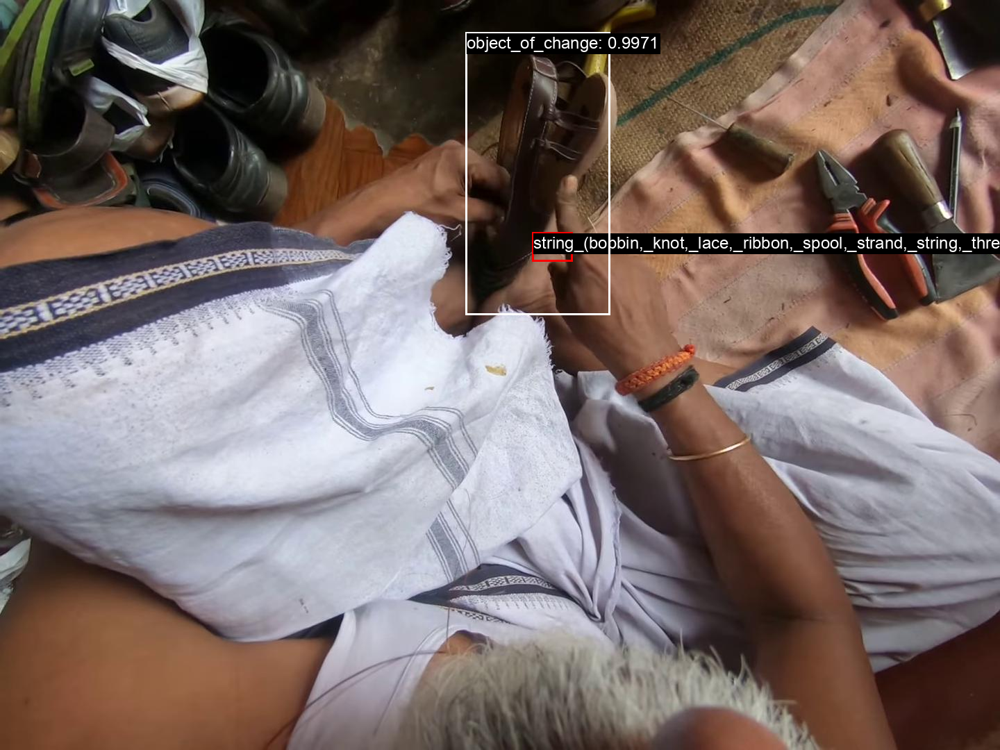

Method: /local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/baselines/VideoIntern/ego4dv1_pnr_objects/inference/test_with_gt.json
Used Narrations (if any): []


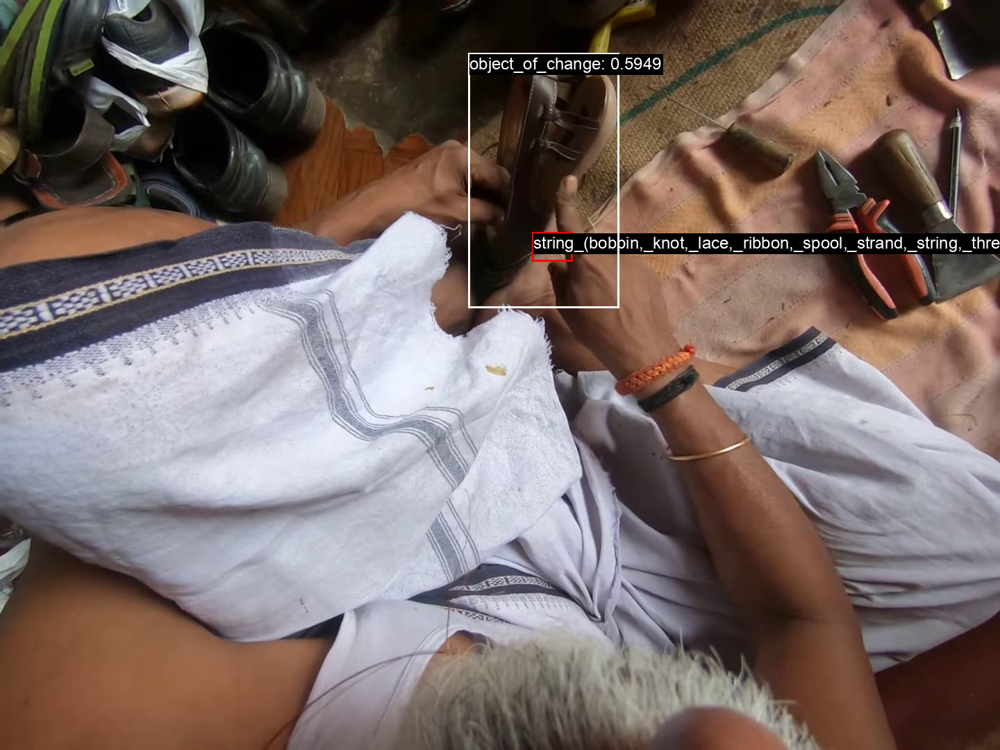

--------------------------------------------------


In [355]:
# To visualize one randomly sampled results, we can define certain criteria (can be none).
# individual precision score for AP50 is either 1 or 0 for each data point.
# So precision > 0 means correct, while <= 0 means wrong, for AP50 results.
# TODO(telinwu): when AP is incorporated, make the criteria more sophisticated.

# Current criteria is both result 3 and 4 should be wrong.
# TODO: can change the below criteria function.
criteria = {
    
    output_results_json_file_3: lambda x: x["pnr_frame"]["precision"] <= 0,
    output_results_json_file_4: lambda x: x["pnr_frame"]["precision"] <= 0,
}
# criteria = None
keys_to_sample_from = keys

if criteria is not None:
    for file_name in criteria:
        fulfill_keys = []
        file_res = all_keyed_results[file_name]
        for data_key, data_res in file_res.items():
            if criteria[file_name](data_res):
                fulfill_keys.append(data_key)
        keys_to_sample_from = set(keys_to_sample_from).intersection(set(fulfill_keys))
    keys_to_sample_from = sorted(list(keys_to_sample_from))

print("Valid results fulfilling the criteria: {}".format(len(keys_to_sample_from)))
print()

# Randomly sample a key.
rand_key = np.random.choice(keys_to_sample_from)
print("{}: {}".format(bold_text("Sampled Key:"), rand_key))

# TODO: decide which inference file results should be shown.
named_result_tuple_list = [
    # (output_results_json_file_1, output_results["output_results_1"][rand_key]),
    # (output_results_json_file_2, output_results["output_results_2"][rand_key]),
    (output_results_json_file_3, output_results["output_results_3"][rand_key]),
    (output_results_json_file_4, output_results["output_results_4"][rand_key]),
]

# Gets the narration for reference.
clip_narrations, closest_narrations = get_scod_clipped_narrations(
    keyed_scod_clips[rand_key],
    all_narrations,
    curr_videos_root,
    narration_pass="narration_pass_1",
    top_k=5,
    verbose=True,
)

# Show the results.
# `frame_keys` here define which frames to be shown.
# If the prediction results do not contain certain specified frames, the images
# will just show the GT bbox (in red).
# TODO: can change `bbox_width`, `label_font_size`, and `resize_image_width`,
# where the `resize_image_width` resizes image widht and height will follow the aspect ratio.
visualize_glip_results_comparisons(
    named_result_tuple_list,
    #top_k_bboxes=top_k,
    top_k_bboxes=1,
    resize_image_width=None,
    # frame_keys=["pre", "pnr", "post"],
    # frame_keys=["pre", "pnr"],
    frame_keys=["pnr"],
    bbox_width=3,
    label_font_size=24,
    scod_clip=keyed_scod_clips[rand_key],
    image_folder="/local1/telinwu/research/resources/Ego4D/ego4d_scod_challenge/pre_pnr_post_png_frames",
)

In [277]:
# Interested keys:
# 5f7e3f1e-f4db-461e-8344-c8f130985635_68630
# f6277269-1c87-439c-b5be-d4a02343018a_16740

# Most likely does not know what a jug is:
# c864505c-9d49-4da4-bf7e-254b4c348c03_48705

# DETR recognizes the wrong object for jug:
# c864505c-9d49-4da4-bf7e-254b4c348c03_47437

# GLIP does better:
# eaa817af-b7e0-4f0a-8156-73834cf1157b_27506

# Attributes of a pack?
# c8f8ebf1-5613-4f4a-802c-ada5e4c4b651_4225

# I feel the answer is ok, `cloth` should change state too.
# 8e23dc43-7025-4548-a2bd-0f7d85631602_10361

# GT is off
# 59815805-de31-4993-8f5e-f12b1537bcfc_60560

# `meals`
# 65c16752-c157-4a21-9654-d980f8fdf36c_9362

# detectors strong on hands
# 2d29b45a-169b-453f-8050-98ec147b0ccf_13605

# wrong cupboard
# c2a3d4ac-8d13-4daa-a9a9-a867999e956f_33554

# May need motion and better grounding
# 826e419a-8788-484f-9543-550964666762_60078

# Better inference may solve:
# 17324963-0877-482d-a189-11cc2862095c_39045

# To me, this is good:
# 5d8ebbea-6371-4be5-b611-751fb49ec294_18515

# Better inference may solve:
# c396d137-e956-4a7f-ab2e-5a0b29c51afa_9125

# Better inference may solve:
# 51224e32-3d6c-4148-9eea-7b73da751f25_8416

# ...

# END